In [2]:
import xarray as xr
import numpy as np
from matplotlib import pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from cartopy.mpl.ticker import LongitudeFormatter, LatitudeFormatter

In [2]:
url_sw = 'https://coastwatch.pfeg.noaa.gov/erddap/griddap/jplMURSST41'

In [3]:
import xarray as xr

# Attempt to load the dataset
try:
    ds = xr.open_dataset(url_sw)
    print(ds)  # Inspect the dataset structure

    # Check for the variable and time coordinate
    if "analysed_sst" in ds:
        sst_data = ds["analysed_sst"]
        print(sst_data)  # Inspect SST data

        # Select the time and spatial slices
        sst_selected = (
            sst_data
            .sel(time=slice("2011-01-01", "2011-12-31"))
            .sel(latitude=slice(-34.32647200636385, -22.571988299456965), 
                 longitude=slice(108.50999997576908, 116.2838084428594))
        )
        
        print(sst_selected)  # Inspect the selected data
    else:
        print("Variable 'analysed_sst' not found in dataset.")
except Exception as e:
    print(f"An error occurred: {e}")

<xarray.Dataset>
Dimensions:           (time: 8169, latitude: 17999, longitude: 36000)
Coordinates:
  * time              (time) datetime64[ns] 2002-06-01T09:00:00 ... 2024-10-1...
  * latitude          (latitude) float32 -89.99 -89.98 -89.97 ... 89.98 89.99
  * longitude         (longitude) float32 -180.0 -180.0 -180.0 ... 180.0 180.0
Data variables:
    analysed_sst      (time, latitude, longitude) float64 ...
    analysis_error    (time, latitude, longitude) float64 ...
    mask              (time, latitude, longitude) float32 ...
    sea_ice_fraction  (time, latitude, longitude) float64 ...
Attributes: (12/51)
    _NCProperties:              version=2,netcdf=4.7.4,hdf5=1.8.12
    acknowledgement:            Please acknowledge the use of these data with...
    cdm_data_type:              Grid
    comment:                    MUR = "Multi-scale Ultra-high Resolution"
    Conventions:                CF-1.6, COARDS, ACDD-1.3
    creator_email:              ghrsst@podaac.jpl.nasa.gov
   

In [4]:
sst_selected

<xarray.DataArray 'analysed_sst' (time: 365, latitude: 1175, longitude: 778)>
[333664750 values with dtype=float64]
Coordinates:
  * time       (time) datetime64[ns] 2011-01-01T09:00:00 ... 2011-12-31T09:00:00
  * latitude   (latitude) float32 -34.32 -34.31 -34.3 ... -22.6 -22.59 -22.58
  * longitude  (longitude) float32 108.5 108.5 108.5 108.5 ... 116.3 116.3 116.3
Attributes:
    colorBarMaximum:  32.0
    colorBarMinimum:  0.0
    comment:          "Final" version using Multi-Resolution Variational Anal...
    ioos_category:    Temperature
    long_name:        Analysed Sea Surface Temperature
    source:           MODIS_T-JPL, MODIS_A-JPL, AVHRRMTB_G-NAVO, iQUAM-NOAA/N...
    standard_name:    sea_surface_foundation_temperature
    units:            degree_C
    valid_max:        57.767
    valid_min:        -7.767000000000003

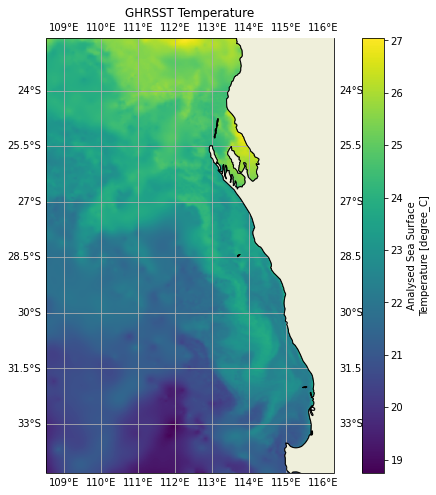

In [63]:
import xarray as xr
import matplotlib.pyplot as plt
import cartopy.crs as ccrs

# Assuming you have your interpolated dataset
# interpolated_ds = ... (your interpolation process here)

# Create a figure and an axis with a Cartopy projection
fig, ax = plt.subplots(figsize=(10, 8), subplot_kw={'projection': ccrs.PlateCarree()})

# Plot the temperature data
sst_selected[0].plot(ax=ax, transform=ccrs.PlateCarree(), cmap='viridis', add_colorbar=True)

# Add coastlines and land
ax.coastlines()
ax.add_feature(cartopy.feature.LAND, zorder=10, edgecolor='black')

# Optionally, add gridlines
ax.gridlines(draw_labels=True)

# Set titles and labels
ax.set_title('GHRSST Temperature')
plt.show()

In [5]:
sst_selected.to_netcdf("/csiem/ghrsst_same_region__2011_ROMS.nc")

### Now we will compare bewteen interpolated sst (roms) and observation sst (GHRSST)

In [12]:
import xarray as xr
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from cartopy.mpl.ticker import LongitudeFormatter, LatitudeFormatter  # Correct import

In [19]:
rom_sst=xr.open_dataset("/csiem/interpolated_Temp.nc")
ghr_sst=xr.open_dataset("/csiem/ghrsst_same_region_ROMS.nc")

In [9]:
rom_sst=xr.open_dataset("/csiem/ROMS/Surface_temp/surface temp_Salt_2022.nc")

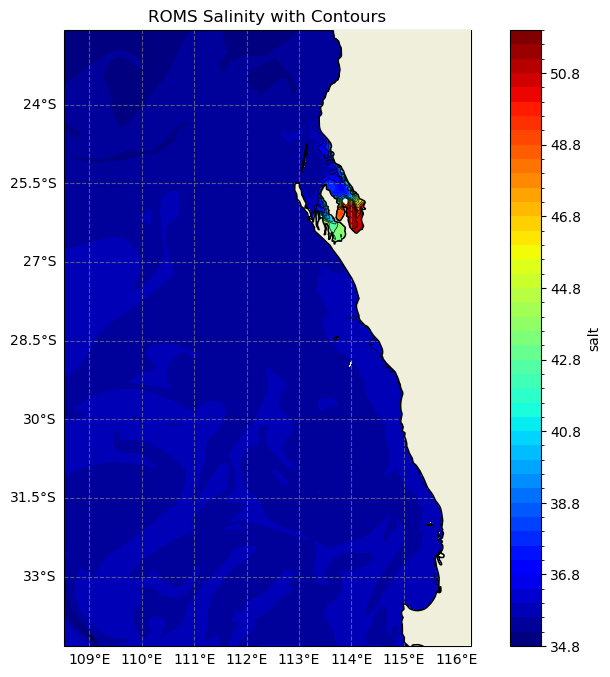

In [16]:
import cmocean
import cartopy
# Create a figure and an axis with a Cartopy projection
fig, ax = plt.subplots(figsize=(10, 8), subplot_kw={'projection': ccrs.PlateCarree()})

# Plot the filled contour for temperature data
contourf = rom_sst.salt[0].plot.contourf(ax=ax, transform=ccrs.PlateCarree(),
                                     cmap='jet', levels=20, add_colorbar=True)

# Add contour lines on top of the filled contours
contours = rom_sst.salt[0].plot.contour(ax=ax, transform=ccrs.PlateCarree(),
                                    colors='black', linewidths=0.5, levels=20)

# Add contour labels
plt.clabel(contours, inline=True, fontsize=8, fmt='%.1f', colors='black')

# Add coastlines and land
ax.coastlines()
ax.add_feature(cartopy.feature.LAND, zorder=10, edgecolor='black')
gl = ax.gridlines(draw_labels=True, crs=ccrs.PlateCarree(),
                  linewidth=0.8, color='gray', alpha=0.7, linestyle='--')
gl.top_labels = False  # Disable top labels (corrected)
gl.right_labels = False  # Disable right labels (correcteds
gl.xformatter = LongitudeFormatter()  # Corrected Longitude formatter
gl.yformatter = LatitudeFormatter()  # Corrected Latitude formatter
# Customize gridline labels' font size
gl.xlabel_style = {'size': 10, 'color': 'black'}
gl.ylabel_style = {'size': 10, 'color': 'black'}
# Set titles and labels
ax.set_title('ROMS Salinity with Contours')

# Show the plot
plt.show()

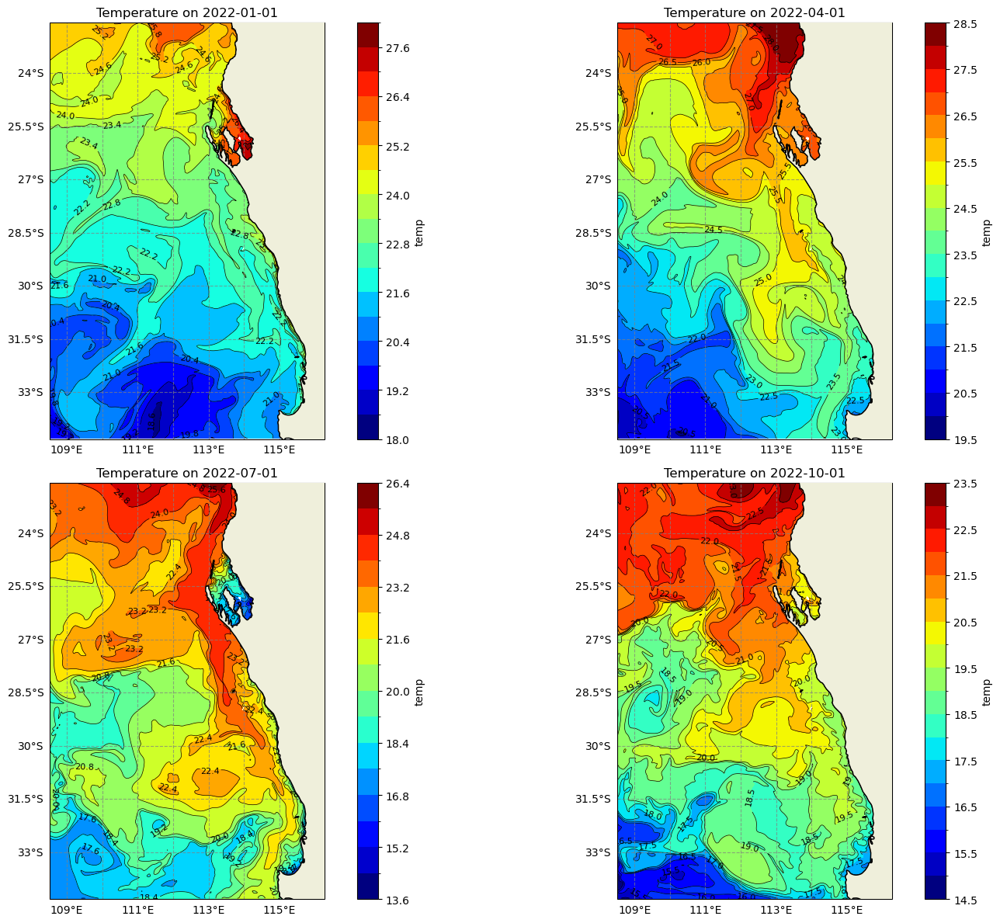

In [18]:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from cartopy.mpl.ticker import LongitudeFormatter, LatitudeFormatter
import pandas as pd

# The four specific dates you want to plot
dates_to_plot = ['2022-01-01', '2022-04-01', '2022-07-01', '2022-10-01']

# Convert the list of dates to pandas datetime objects for indexing
dates_to_plot = pd.to_datetime(dates_to_plot)

# Create a 2x2 plot for the four dates
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(16, 12), 
                         subplot_kw={'projection': ccrs.PlateCarree()})

# Flatten axes to easily iterate through them
axes = axes.flatten()

# Loop through the dates and axes to plot each date's data
for i, date in enumerate(dates_to_plot):
    ax = axes[i]

    # Extract data for the specific date
    temp_data = rom_sst.temp.sel(ocean_time=date,method='nearest')

    # Plot the filled contour for temperature data
    contourf = temp_data.plot.contourf(ax=ax, transform=ccrs.PlateCarree(),
                                       cmap='jet', levels=20, add_colorbar=True)

    # Add contour lines on top of the filled contours
    contours = temp_data.plot.contour(ax=ax, transform=ccrs.PlateCarree(),
                                      colors='black', linewidths=0.5, levels=20)
    plt.clabel(contours, inline=True, fontsize=8, fmt='%.1f', colors='black')

    # Add coastlines and land
    ax.coastlines()
    ax.add_feature(cfeature.LAND, zorder=10, edgecolor='black')

    # Add gridlines with updated attributes
    gl = ax.gridlines(draw_labels=True, crs=ccrs.PlateCarree(),
                      linewidth=0.8, color='gray', alpha=0.7, linestyle='--')
    gl.top_labels = False
    gl.right_labels = False
    gl.xformatter = LongitudeFormatter()
    gl.yformatter = LatitudeFormatter()
    gl.xlabel_style = {'size': 10, 'color': 'black'}
    gl.ylabel_style = {'size': 10, 'color': 'black'}

    # Set title for the subplot
    ax.set_title(f'Temperature on {date.strftime("%Y-%m-%d")}', fontsize=12)

# Adjust layout
plt.tight_layout()

# Show the plot
plt.show()

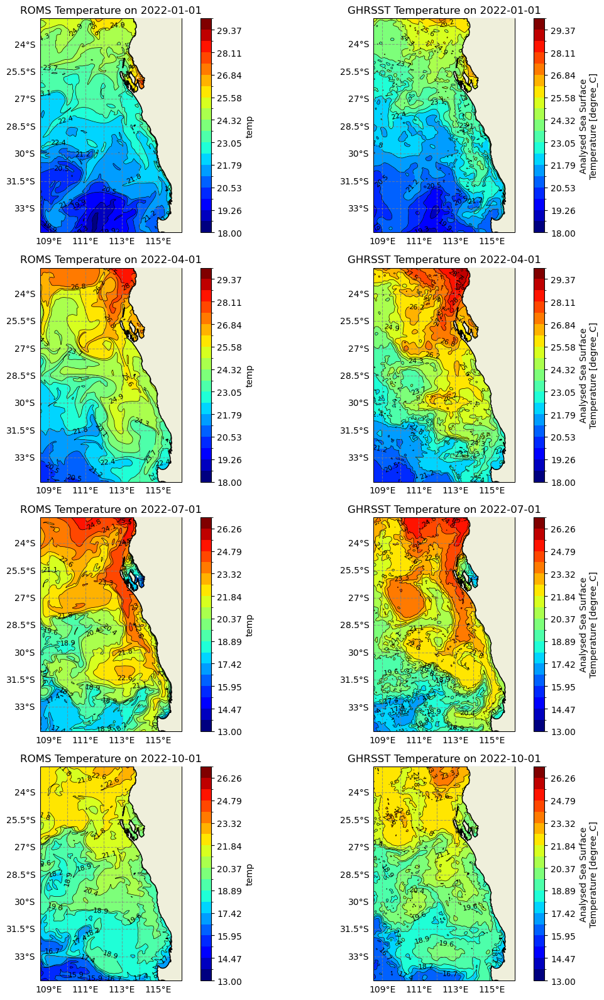

In [28]:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from cartopy.mpl.ticker import LongitudeFormatter, LatitudeFormatter
import pandas as pd
import xarray as xr
import numpy as np

# The four specific dates you want to plot
dates_to_plot = ['2022-01-01', '2022-04-01', '2022-07-01', '2022-10-01']
dates_to_plot = pd.to_datetime(dates_to_plot)

# Create a 4x2 grid (2 columns, 4 rows) for 8 plots (left ROMS, right GHRSST)
fig, axes = plt.subplots(nrows=4, ncols=2, figsize=(12, 16), 
                         subplot_kw={'projection': ccrs.PlateCarree()})

# Flatten axes for easier iteration
axes = axes.flatten()

# Loop through the dates and plot ROMS (left) and GHRSST (right) for each date
for i, date in enumerate(dates_to_plot):
    # ROMS Plot (left column)
    ax_roms = axes[2 * i]
    temp_roms = rom_sst.temp.sel(ocean_time=date, method='nearest')

    # GHRSST Plot (right column)
    ax_ghrsst = axes[2 * i + 1]
    temp_ghrsst = ghr_sst.analysed_sst.sel(time=date, method='nearest')

    # Set the color levels for contour plots based on the date
    if date.strftime('%Y-%m-%d') in ['2022-01-01', '2022-04-01']:
        vmin, vmax = 18, 30  # For January and April
    else:
        vmin, vmax = 13, 27  # For July and October

    levels = np.linspace(vmin, vmax, 20)

    # Plot ROMS with filled contours and contour lines
    contourf_roms = temp_roms.plot.contourf(ax=ax_roms, transform=ccrs.PlateCarree(),
                                            cmap='jet', levels=levels, add_colorbar=True)
    contours_roms = temp_roms.plot.contour(ax=ax_roms, transform=ccrs.PlateCarree(),
                                           colors='black', linewidths=0.5, levels=levels)
    plt.clabel(contours_roms, inline=True, fontsize=8, fmt='%.1f', colors='black')
    ax_roms.coastlines()
    ax_roms.add_feature(cfeature.LAND, zorder=10, edgecolor='black')
    ax_roms.set_title(f'ROMS Temperature on {date.strftime("%Y-%m-%d")}', fontsize=12)

    # Add gridlines for ROMS
    gl_roms = ax_roms.gridlines(draw_labels=True, linewidth=0.8, color='gray', alpha=0.7, linestyle='--')
    gl_roms.top_labels = False
    gl_roms.right_labels = False
    gl_roms.xformatter = LongitudeFormatter()
    gl_roms.yformatter = LatitudeFormatter()

    # Plot GHRSST with filled contours and contour lines
    contourf_ghrsst = temp_ghrsst.plot.contourf(ax=ax_ghrsst, transform=ccrs.PlateCarree(),
                                                cmap='jet', levels=levels, add_colorbar=True)
    contours_ghrsst = temp_ghrsst.plot.contour(ax=ax_ghrsst, transform=ccrs.PlateCarree(),
                                               colors='black', linewidths=0.5, levels=levels)
    plt.clabel(contours_ghrsst, inline=True, fontsize=8, fmt='%.1f', colors='black')
    ax_ghrsst.coastlines()
    ax_ghrsst.add_feature(cfeature.LAND, zorder=10, edgecolor='black')
    ax_ghrsst.set_title(f'GHRSST Temperature on {date.strftime("%Y-%m-%d")}', fontsize=12)

    # Add gridlines for GHRSST
    gl_ghrsst = ax_ghrsst.gridlines(draw_labels=True, linewidth=0.8, color='gray', alpha=0.7, linestyle='--')
    gl_ghrsst.top_labels = False
    gl_ghrsst.right_labels = False
    gl_ghrsst.xformatter = LongitudeFormatter()
    gl_ghrsst.yformatter = LatitudeFormatter()

# Adjust layout to prevent overlap
plt.tight_layout()

# Show the plot
plt.show()

In [42]:
ghr_avg_time_series = ghr_sst.analysed_sst.mean(dim='latitude', skipna=True).mean(dim='longitude', skipna=True)

# Check the results
ghr_avg_time_series

<xarray.DataArray 'analysed_sst' (time: 365)>
array([22.51109697, 22.5269251 , 22.5526617 , 22.61549598, 22.68238908,
       22.72137262, 22.68724729, 22.59409497, 22.5146568 , 22.59307323,
       22.77157318, 22.85210278, 22.81335905, 22.8017202 , 22.74582233,
       22.67203157, 22.80130298, 23.08667245, 23.39653502, 23.48547011,
       23.71022237, 23.64695676, 23.54442057, 23.30745119, 23.18823246,
       23.1580603 , 23.17146263, 23.19525663, 23.20437639, 23.16277693,
       23.16930276, 23.24476069, 23.43840626, 23.58121574, 23.80030256,
       23.81297849, 23.52820713, 23.28939142, 23.16798134, 23.40654783,
       23.60834465, 23.73444463, 23.72547708, 23.6448343 , 23.69356082,
       23.85717647, 24.00880429, 24.21382396, 24.38248987, 24.77107176,
       24.84976785, 24.8311105 , 24.77473661, 24.56859649, 24.35390937,
       24.13071186, 24.00595318, 23.9377416 , 23.91917386, 23.86754599,
       23.51070751, 23.3997565 , 23.39305826, 23.54239713, 23.70585238,
       23.98352706, 24.09869777, 24.21884557, 24.30021494, 24.37584027,
       24.30148694, 24.26347384, 24.2751704 , 24.25722844, 24.26124133,
       24.33030886, 24.29533593, 24.14346626, 23.89293799, 23.72643967,
       23.75399519, 23.75454259, 23.75715791, 23.76097325, 23.70655538,
       23.70607357, 23.75008238, 23.87787707, 24.09773835, 24.25071864,
       24.26346684, 24.24002386, 24.2064647 , 24.17654669, 24.20393695,
       24.19590609, 24.20213095, 24.21762784, 24.00527197, 23.52432882,
...
       19.71138238, 19.75724688, 19.794781  , 19.73055499, 19.72708348,
       19.76599508, 19.83264989, 19.8944938 , 19.85982597, 19.86912926,
       19.9431254 , 19.92456763, 19.88802463, 19.80597126, 19.84428072,
       19.90065977, 19.8922181 , 19.89406203, 19.71981683, 19.70896283,
       19.76462355, 19.87073323, 19.98581037, 19.96994612, 19.93323776,
       19.95481842, 20.09055171, 20.18465806, 20.43280225, 20.42303171,
       20.32207696, 20.16677893, 20.06248892, 20.0252537 , 19.98373989,
       19.93046484, 19.82227019, 19.64960654, 19.60337768, 19.60796622,
       19.77885943, 20.0201528 , 20.01635007, 19.89977471, 19.91787973,
       19.98525613, 20.11284095, 20.16977167, 20.13826372, 20.081873  ,
       19.95739496, 19.95528537, 19.9608163 , 19.9742798 , 19.95873287,
       19.93692612, 19.81491115, 19.70802848, 19.72001985, 19.79757384,
       19.92185707, 20.15718821, 20.21195981, 20.23032165, 20.29187607,
       20.47213431, 20.63611033, 20.73534217, 20.75923048, 20.81859484,
       20.86969476, 20.87542742, 20.85004629, 20.80910358, 20.8358473 ,
       20.85887408, 20.87687333, 20.90500644, 20.91416308, 20.89621287,
       20.81921901, 20.82914413, 20.88747565, 20.93796597, 21.11968492,
       21.27732503, 21.4965594 , 21.47445815, 21.67371102, 21.9384441 ,
       22.06111656, 22.21138416, 22.18429904, 22.16343637, 22.08029797,
       22.00596522, 22.02115701, 22.03857531, 22.04847146, 22.02121614])
Coordinates:
  * time     (time) datetime64[ns] 2022-01-01T09:00:00 ... 2022-12-31T09:00:00

In [43]:
import numpy as np
# Create a mask to filter out NaN and infinite values
filtered_rom_sst = rom_sst.temp.where(np.isfinite(rom_sst.temp))
# Calculate the average SST by lat and lon while skipping NaN and infinite values
rom_avg_time_series = filtered_rom_sst.mean(dim='lat', skipna=True).mean(dim='lon', skipna=True)
# Check the results
rom_avg_time_series

<xarray.DataArray 'temp' (ocean_time: 365)>
array([22.23332404, 22.23941944, 22.23943046, 22.30767184, 22.45396619,
       22.48586859, 22.57705251, 22.49447947, 22.31857382, 22.29373869,
       22.40472147, 22.48991483, 22.53703904, 22.58216183, 22.52819833,
       22.42773296, 22.43740844, 22.74662943, 22.96865518, 23.10227711,
       23.31210369, 23.45391353, 23.4154658 , 23.15011828, 23.02909501,
       22.98664534, 22.91380253, 22.95892888, 23.12042926, 23.13566582,
       23.04391089, 23.01466134, 23.15833672, 23.3602019 , 23.49851797,
       23.67309379, 23.36587855, 23.09665182, 23.07214479, 23.08275891,
       23.23107915, 23.44201372, 23.43454258, 23.49980959, 23.66827366,
       23.87914749, 23.99189607, 24.15754754, 24.38998015, 24.47541922,
       24.4659701 , 24.52600736, 24.43377169, 24.26031728, 24.21133737,
       24.15529636, 24.01471387, 23.93127592, 23.90982242, 23.76727959,
       23.54908192, 23.35619064, 23.30524389, 23.39474646, 23.50447654,
       23.5699148 , 23.70512324, 23.83838957, 23.95906028, 24.08638306,
       24.07572558, 24.08219725, 24.08957875, 24.03087179, 23.99231572,
       24.03735977, 24.03031513, 23.93548293, 23.89880615, 23.77928283,
       23.69659396, 23.64574697, 23.70468155, 23.78881415, 23.76179859,
       23.71361146, 23.70904087, 23.76321778, 23.8678415 , 23.99919464,
       24.08714912, 24.15254671, 24.08823465, 23.94889653, 23.89183114,
       23.89223767, 23.96566579, 23.81500752, 23.63540834, 23.49004884,
...
       19.42330482, 19.36831771, 19.3623272 , 19.41338738, 19.4710668 ,
       19.50202138, 19.55779704, 19.65800275, 19.64823887, 19.63869472,
       19.70733755, 19.76090584, 19.65980014, 19.60103812, 19.62870118,
       19.67247893, 19.65724598, 19.60815167, 19.56603144, 19.53746344,
       19.55431421, 19.58978187, 19.63089249, 19.58514679, 19.5914623 ,
       19.70200429, 19.79703783, 19.83377407, 19.91071565, 20.0510611 ,
       19.97169241, 19.93667108, 19.90947995, 19.89890281, 19.86929246,
       19.83926354, 19.75359732, 19.65940604, 19.61848486, 19.63129489,
       19.7368009 , 19.93657357, 19.8516875 , 19.83715271, 19.84973343,
       19.87312052, 19.96942504, 20.05148882, 19.97761492, 19.88150013,
       19.81872106, 19.80405992, 19.84098618, 19.9606667 , 19.93301569,
       19.82309218, 19.7160815 , 19.69915036, 19.7585765 , 19.89162856,
       20.08803706, 20.18356901, 20.2401443 , 20.25473834, 20.24066456,
       20.24825847, 20.35870837, 20.57471253, 20.60897544, 20.64335307,
       20.72580629, 20.74929174, 20.7474679 , 20.7538106 , 20.72961204,
       20.7823573 , 20.78880606, 20.80280261, 20.79389142, 20.76899471,
       20.80199956, 20.87470884, 20.99629008, 21.05442429, 21.14835836,
       21.28849678, 21.48060737, 21.6416178 , 21.77665036, 21.87377719,
       21.97613552, 22.12019578, 22.21865632, 22.22808863, 22.13568891,
       21.97579969, 21.97734725, 22.08429361, 22.09694283, 22.01738911])
Coordinates:
  * ocean_time  (ocean_time) datetime64[ns] 2022-01-01T12:00:00 ... 2022-12-3...
    s_rho       float64 -0.02

In [44]:
rom_avg_df = rom_avg_time_series.to_dataframe(name='ROMS Average SST').reset_index()
ghr_avg_df = ghr_avg_time_series.to_dataframe(name='GHRSST Average SST').reset_index()

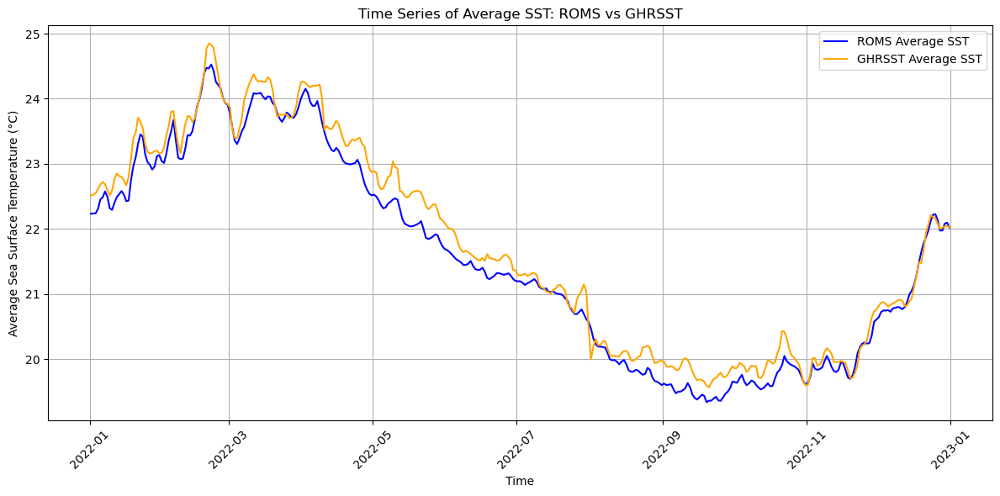

In [47]:
# Plotting the time series
plt.figure(figsize=(12, 6))
plt.plot(rom_avg_df['ocean_time'], rom_avg_df['ROMS Average SST'], label='ROMS Average SST', color='blue')
plt.plot(rom_avg_df['ocean_time'], ghr_avg_df['GHRSST Average SST'], label='GHRSST Average SST', color='orange')

# Add titles and labels
plt.title('Time Series of Average SST: ROMS vs GHRSST')
plt.xlabel('Time')
plt.ylabel('Average Sea Surface Temperature (°C)')
plt.legend()
plt.grid()
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
plt.tight_layout()

In [58]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from scipy import stats

In [49]:
# Ensure the ocean_time is in datetime format (if not already)
rom_avg_df['ocean_time'] = pd.to_datetime(rom_avg_df['ocean_time'])

# Rename the time column in ghr_avg_df to match
ghr_avg_df.rename(columns={'time': 'ocean_time'}, inplace=True)

In [55]:
ghr_avg_df

,ocean_time,GHRSST Average SST
0,2022-01-01 09:00:00,22.511097
1,2022-01-02 09:00:00,22.526925
2,2022-01-03 09:00:00,22.552662
3,2022-01-04 09:00:00,22.615496
4,2022-01-05 09:00:00,22.682389
...,...,...
360,2022-12-27 09:00:00,22.005965
361,2022-12-28 09:00:00,22.021157
362,2022-12-29 09:00:00,22.038575
363,2022-12-30 09:00:00,22.048471


In [54]:
rom_avg_df

,ocean_time,s_rho,ROMS Average SST
0,2022-01-01 12:00:00,-0.02,22.233324
1,2022-01-02 12:00:00,-0.02,22.239419
2,2022-01-03 12:00:00,-0.02,22.239430
3,2022-01-04 12:00:00,-0.02,22.307672
4,2022-01-05 12:00:00,-0.02,22.453966
...,...,...,...
360,2022-12-27 12:00:00,-0.02,21.975800
361,2022-12-28 12:00:00,-0.02,21.977347
362,2022-12-29 12:00:00,-0.02,22.084294
363,2022-12-30 12:00:00,-0.02,22.096943


In [56]:
# Concatenate the DataFrames vertically
concatenated_df = pd.concat([rom_avg_df, ghr_avg_df], axis=1)

# Display the concatenated DataFrame
print(concatenated_df)

             ocean_time  s_rho  ROMS Average SST          ocean_time  \
0   2022-01-01 12:00:00  -0.02         22.233324 2022-01-01 09:00:00   
1   2022-01-02 12:00:00  -0.02         22.239419 2022-01-02 09:00:00   
2   2022-01-03 12:00:00  -0.02         22.239430 2022-01-03 09:00:00   
3   2022-01-04 12:00:00  -0.02         22.307672 2022-01-04 09:00:00   
4   2022-01-05 12:00:00  -0.02         22.453966 2022-01-05 09:00:00   
..                  ...    ...               ...                 ...   
360 2022-12-27 12:00:00  -0.02         21.975800 2022-12-27 09:00:00   
361 2022-12-28 12:00:00  -0.02         21.977347 2022-12-28 09:00:00   
362 2022-12-29 12:00:00  -0.02         22.084294 2022-12-29 09:00:00   
363 2022-12-30 12:00:00  -0.02         22.096943 2022-12-30 09:00:00   
364 2022-12-31 12:00:00  -0.02         22.017389 2022-12-31 09:00:00   

     GHRSST Average SST  
0             22.511097  
1             22.526925  
2             22.552662  
3             22.615496  
4    

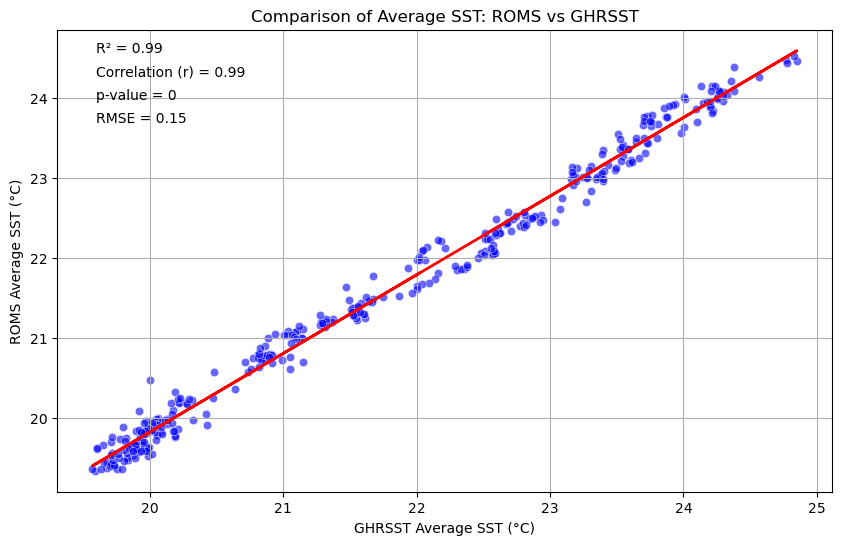

In [60]:
# Create scatter plot
plt.figure(figsize=(10, 6))
sns.scatterplot(data=concatenated_df, x='GHRSST Average SST', y='ROMS Average SST', color='blue', alpha=0.6)

# Fit a linear regression model
x = concatenated_df['GHRSST Average SST'].values.reshape(-1, 1)
y = concatenated_df['ROMS Average SST'].values
model = LinearRegression().fit(x, y)
y_pred = model.predict(x)

# Calculate statistics
r, p_value = stats.pearsonr(concatenated_df['GHRSST Average SST'], concatenated_df['ROMS Average SST'])
rmse = np.sqrt(mean_squared_error(y, y_pred))
r_squared = model.score(x, y)

# Plot regression line
plt.plot(concatenated_df['GHRSST Average SST'], y_pred, color='red', linewidth=2)

# Add labels and title
plt.xlabel('GHRSST Average SST (°C)')
plt.ylabel('ROMS Average SST (°C)')
plt.title('Comparison of Average SST: ROMS vs GHRSST')

# Display statistics on the plot
plt.text(0.05, 0.95, f'R² = {r_squared:.2f}', transform=plt.gca().transAxes)
plt.text(0.05, 0.90, f'Correlation (r) = {r:.2f}', transform=plt.gca().transAxes)
plt.text(0.05, 0.85, f'p-value = {p_value:.2g}', transform=plt.gca().transAxes)
plt.text(0.05, 0.80, f'RMSE = {rmse:.2f}', transform=plt.gca().transAxes)

# Show plot
plt.grid()
plt.show()

In [6]:
rom_sst=xr.open_dataset("/csiem/ROMS/Surface_temp/surface temp_Salt_2011.nc")
ghr_sst=xr.open_dataset("/csiem/ghrsst_same_region__2011_ROMS.nc")

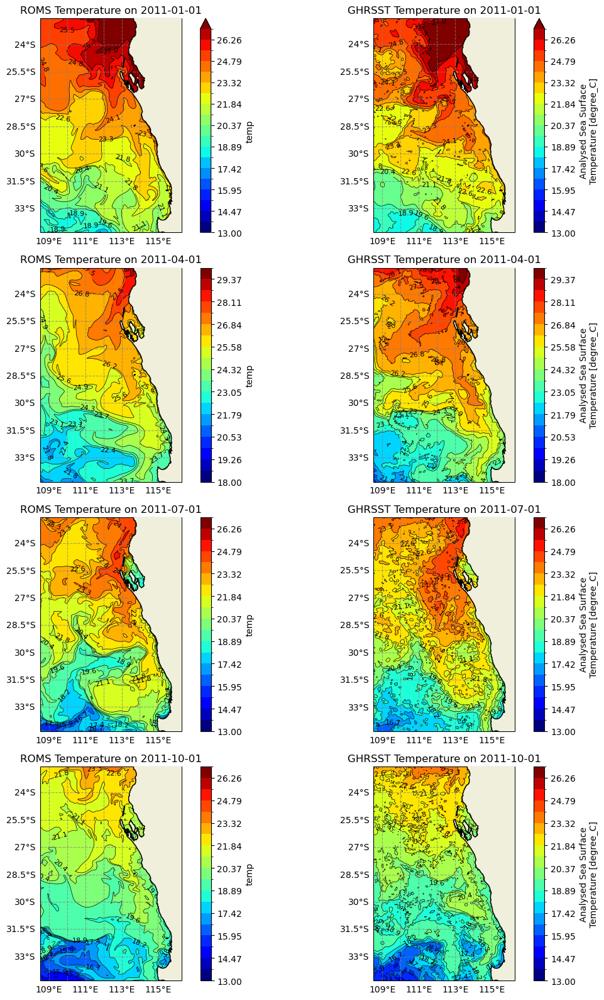

In [8]:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from cartopy.mpl.ticker import LongitudeFormatter, LatitudeFormatter
import pandas as pd
import xarray as xr
import numpy as np

# The four specific dates you want to plot
dates_to_plot = ['2011-01-01', '2011-04-01', '2011-07-01', '2011-10-01']
dates_to_plot = pd.to_datetime(dates_to_plot)

# Create a 4x2 grid (2 columns, 4 rows) for 8 plots (left ROMS, right GHRSST)
fig, axes = plt.subplots(nrows=4, ncols=2, figsize=(12, 16), 
                         subplot_kw={'projection': ccrs.PlateCarree()})

# Flatten axes for easier iteration
axes = axes.flatten()

# Loop through the dates and plot ROMS (left) and GHRSST (right) for each date
for i, date in enumerate(dates_to_plot):
    # ROMS Plot (left column)
    ax_roms = axes[2 * i]
    temp_roms = rom_sst.temp.sel(ocean_time=date, method='nearest')

    # GHRSST Plot (right column)
    ax_ghrsst = axes[2 * i + 1]
    temp_ghrsst = ghr_sst.analysed_sst.sel(time=date, method='nearest')

    # Set the color levels for contour plots based on the date
    if date.strftime('%Y-%m-%d') in ['2021-01-01', '2011-04-01']:
        vmin, vmax = 18, 30  # For January and April
    else:
        vmin, vmax = 13, 27  # For July and October

    levels = np.linspace(vmin, vmax, 20)

    # Plot ROMS with filled contours and contour lines
    contourf_roms = temp_roms.plot.contourf(ax=ax_roms, transform=ccrs.PlateCarree(),
                                            cmap='jet', levels=levels, add_colorbar=True)
    contours_roms = temp_roms.plot.contour(ax=ax_roms, transform=ccrs.PlateCarree(),
                                           colors='black', linewidths=0.5, levels=levels)
    plt.clabel(contours_roms, inline=True, fontsize=8, fmt='%.1f', colors='black')
    ax_roms.coastlines()
    ax_roms.add_feature(cfeature.LAND, zorder=10, edgecolor='black')
    ax_roms.set_title(f'ROMS Temperature on {date.strftime("%Y-%m-%d")}', fontsize=12)

    # Add gridlines for ROMS
    gl_roms = ax_roms.gridlines(draw_labels=True, linewidth=0.8, color='gray', alpha=0.7, linestyle='--')
    gl_roms.top_labels = False
    gl_roms.right_labels = False
    gl_roms.xformatter = LongitudeFormatter()
    gl_roms.yformatter = LatitudeFormatter()

    # Plot GHRSST with filled contours and contour lines
    contourf_ghrsst = temp_ghrsst.plot.contourf(ax=ax_ghrsst, transform=ccrs.PlateCarree(),
                                                cmap='jet', levels=levels, add_colorbar=True)
    contours_ghrsst = temp_ghrsst.plot.contour(ax=ax_ghrsst, transform=ccrs.PlateCarree(),
                                               colors='black', linewidths=0.5, levels=levels)
    plt.clabel(contours_ghrsst, inline=True, fontsize=8, fmt='%.1f', colors='black')
    ax_ghrsst.coastlines()
    ax_ghrsst.add_feature(cfeature.LAND, zorder=10, edgecolor='black')
    ax_ghrsst.set_title(f'GHRSST Temperature on {date.strftime("%Y-%m-%d")}', fontsize=12)

    # Add gridlines for GHRSST
    gl_ghrsst = ax_ghrsst.gridlines(draw_labels=True, linewidth=0.8, color='gray', alpha=0.7, linestyle='--')
    gl_ghrsst.top_labels = False
    gl_ghrsst.right_labels = False
    gl_ghrsst.xformatter = LongitudeFormatter()
    gl_ghrsst.yformatter = LatitudeFormatter()

# Adjust layout to prevent overlap
plt.tight_layout()

# Show the plot
plt.show()

In [6]:
rom_salt=xr.open_dataset("/csiem/ROMS/Surface_temp/surface temp_Salt_2011.nc")
moi_salt=xr.open_dataset("/csiem/cmems_mod_glo_phy_my_0.083deg_P1D-m_so_108.58E-116.25E_34.25S-22.58S_0.49m_2011-01-01-2021-06-30.nc")

In [7]:
moi_salt = moi_salt.sel(depth=0.494, method='nearest')
moi_salt

<xarray.Dataset>
Dimensions:    (latitude: 141, longitude: 93, time: 3834)
Coordinates:
    depth      float32 0.494
  * latitude   (latitude) float32 -34.25 -34.17 -34.08 ... -22.75 -22.67 -22.58
  * longitude  (longitude) float32 108.6 108.7 108.8 108.8 ... 116.1 116.2 116.2
  * time       (time) datetime64[ns] 2011-01-01 2011-01-02 ... 2021-06-30
Data variables:
    so         (time, latitude, longitude) float32 ...
Attributes: (12/25)
    Conventions:               CF-1.4
    bulletin_date:             2021-07-07 00:00:00
    bulletin_type:             operational
    comment:                   CMEMS product
    domain_name:               GL12
    easting:                   longitude
    ...                        ...
    references:                http://www.mercator-ocean.fr
    source:                    MERCATOR GLORYS12V1
    title:                     daily mean fields from Global Ocean Physics An...
    z_max:                     5727.9169921875
    z_min:                     0.49402499198913574
    copernicusmarine_version:  1.2.0

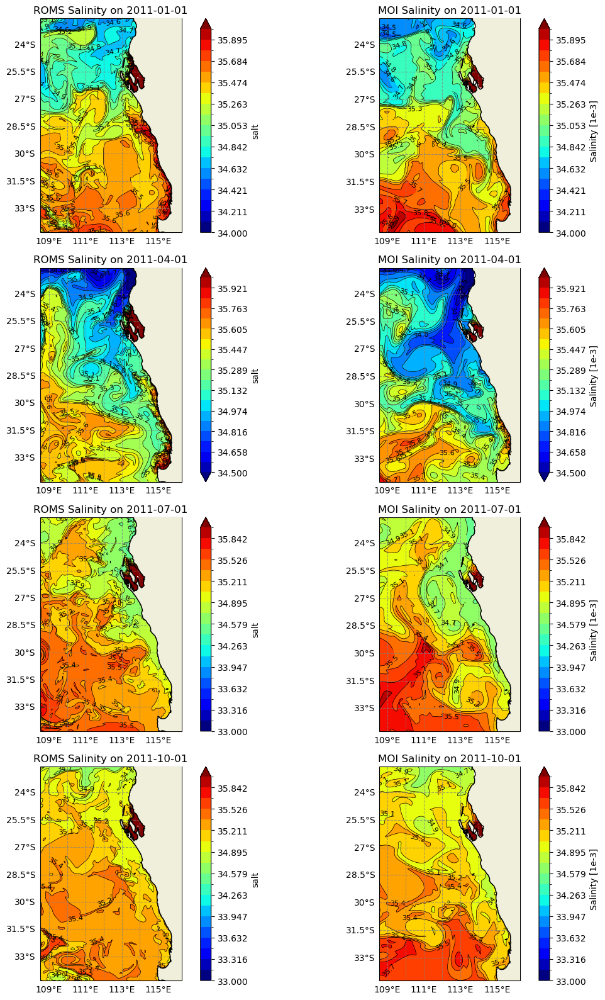

In [9]:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from cartopy.mpl.ticker import LongitudeFormatter, LatitudeFormatter
import pandas as pd
import xarray as xr
import numpy as np

# The four specific dates you want to plot
dates_to_plot = ['2011-01-01', '2011-04-01', '2011-07-01', '2011-10-01']
dates_to_plot = pd.to_datetime(dates_to_plot)

# Create a 4x2 grid (2 columns, 4 rows) for 8 plots (left ROMS, right GHRSST)
fig, axes = plt.subplots(nrows=4, ncols=2, figsize=(12, 16), 
                         subplot_kw={'projection': ccrs.PlateCarree()})

# Flatten axes for easier iteration
axes = axes.flatten()

# Loop through the dates and plot ROMS (left) and GHRSST (right) for each date
for i, date in enumerate(dates_to_plot):
    # ROMS Plot (left column)
    ax_roms = axes[2 * i]
    temp_roms = rom_salt.salt.sel(ocean_time=date, method='nearest')

    # GHRSST Plot (right column)
    ax_ghrsst = axes[2 * i + 1]
    temp_ghrsst = moi_salt.so.sel(time=date, method='nearest')

    # Set the color levels for contour plots based on the date
 
    if date.strftime('%Y-%m-%d') == '2011-01-01':
        vmin, vmax = 34, 36  # For January 1, 2021
    elif date.strftime('%Y-%m-%d') == '2011-04-01':
        vmin, vmax = 34.5, 36  # For April 1, 2011
    elif date.strftime('%Y-%m-%d') == '2011-07-01':
        vmin, vmax = 33, 36  # For July 1, 2021
    elif date.strftime('%Y-%m-%d') == '2011-10-01':
        vmin, vmax = 33, 36  # For October 1, 2021
    else:
        vmin, vmax = 33, 36  # Default case
    
    levels = np.linspace(vmin, vmax, 20)


    # Plot ROMS with filled contours and contour lines
    contourf_roms = temp_roms.plot.contourf(ax=ax_roms, transform=ccrs.PlateCarree(),
                                            cmap='jet', levels=levels, add_colorbar=True)
    contours_roms = temp_roms.plot.contour(ax=ax_roms, transform=ccrs.PlateCarree(),
                                           colors='black', linewidths=0.5, levels=levels)
    plt.clabel(contours_roms, inline=True, fontsize=8, fmt='%.1f', colors='black')
    ax_roms.coastlines()
    ax_roms.add_feature(cfeature.LAND, zorder=10, edgecolor='black')
    ax_roms.set_title(f'ROMS Salinity on {date.strftime("%Y-%m-%d")}', fontsize=12)

    # Add gridlines for ROMS
    gl_roms = ax_roms.gridlines(draw_labels=True, linewidth=0.8, color='gray', alpha=0.7, linestyle='--')
    gl_roms.top_labels = False
    gl_roms.right_labels = False
    gl_roms.xformatter = LongitudeFormatter()
    gl_roms.yformatter = LatitudeFormatter()

    # Plot GHRSST with filled contours and contour lines
    contourf_ghrsst = temp_ghrsst.plot.contourf(ax=ax_ghrsst, transform=ccrs.PlateCarree(),
                                                cmap='jet', levels=levels, add_colorbar=True)
    contours_ghrsst = temp_ghrsst.plot.contour(ax=ax_ghrsst, transform=ccrs.PlateCarree(),
                                               colors='black', linewidths=0.5, levels=levels)
    plt.clabel(contours_ghrsst, inline=True, fontsize=8, fmt='%.1f', colors='black')
    ax_ghrsst.coastlines()
    ax_ghrsst.add_feature(cfeature.LAND, zorder=10, edgecolor='black')
    ax_ghrsst.set_title(f'MOI Salinity on {date.strftime("%Y-%m-%d")}', fontsize=12)

    # Add gridlines for GHRSST
    gl_ghrsst = ax_ghrsst.gridlines(draw_labels=True, linewidth=0.8, color='gray', alpha=0.7, linestyle='--')
    gl_ghrsst.top_labels = False
    gl_ghrsst.right_labels = False
    gl_ghrsst.xformatter = LongitudeFormatter()
    gl_ghrsst.yformatter = LatitudeFormatter()

# Adjust layout to prevent overlap
plt.tight_layout()

# Show the plot
plt.show()

In [10]:
rom_salt=xr.open_dataset("/csiem/ROMS/Surface_temp/surface temp_Salt_2022.nc")
moi_salt=xr.open_dataset("/csiem/cmems_mod_glo_phy_myint_0.083deg_P1D-m_1728919139825.nc")

In [11]:
moi_salt = moi_salt.sel(depth=0.494, method='nearest')
moi_salt

<xarray.Dataset>
Dimensions:    (latitude: 141, longitude: 93, time: 549)
Coordinates:
    depth      float32 0.494
  * latitude   (latitude) float32 -34.25 -34.17 -34.08 ... -22.75 -22.67 -22.58
  * longitude  (longitude) float32 108.6 108.7 108.8 108.8 ... 116.1 116.2 116.3
  * time       (time) datetime64[ns] 2021-07-01 2021-07-02 ... 2022-12-31
Data variables:
    so         (time, latitude, longitude) float32 ...
Attributes:
    Conventions:       CF-1.11
    title:             cmems_mod_glo_phy_myint_0.083deg_P1D-m_202311
    subset:source:     ARCO data downloaded from the Marine Data Store using ...
    subset:productId:  GLOBAL_MULTIYEAR_PHY_001_030
    subset:datasetId:  cmems_mod_glo_phy_myint_0.083deg_P1D-m_202311
    subset:date:       2024-10-14T15:18:59.825Z

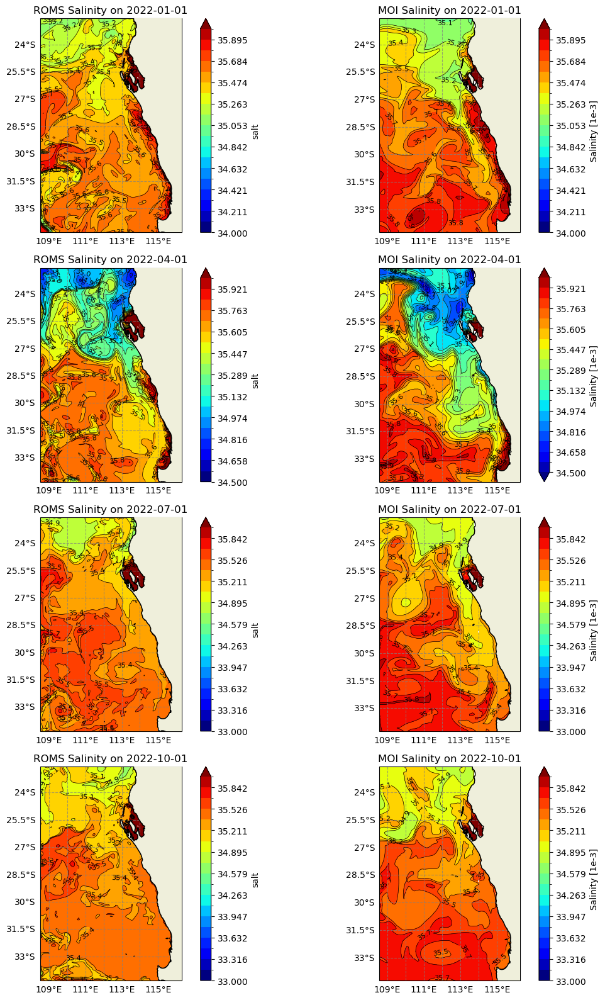

In [13]:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from cartopy.mpl.ticker import LongitudeFormatter, LatitudeFormatter
import pandas as pd
import xarray as xr
import numpy as np

# The four specific dates you want to plot
dates_to_plot = ['2022-01-01', '2022-04-01', '2022-07-01', '2022-10-01']
dates_to_plot = pd.to_datetime(dates_to_plot)

# Create a 4x2 grid (2 columns, 4 rows) for 8 plots (left ROMS, right GHRSST)
fig, axes = plt.subplots(nrows=4, ncols=2, figsize=(12, 16), 
                         subplot_kw={'projection': ccrs.PlateCarree()})

# Flatten axes for easier iteration
axes = axes.flatten()

# Loop through the dates and plot ROMS (left) and GHRSST (right) for each date
for i, date in enumerate(dates_to_plot):
    # ROMS Plot (left column)
    ax_roms = axes[2 * i]
    temp_roms = rom_salt.salt.sel(ocean_time=date, method='nearest')

    # GHRSST Plot (right column)
    ax_ghrsst = axes[2 * i + 1]
    temp_ghrsst = moi_salt.so.sel(time=date, method='nearest')

    # Set the color levels for contour plots based on the date
 
    if date.strftime('%Y-%m-%d') == '2022-01-01':
        vmin, vmax = 34, 36  # For January 1, 2021
    elif date.strftime('%Y-%m-%d') == '2022-04-01':
        vmin, vmax = 34.5, 36  # For April 1, 2011
    elif date.strftime('%Y-%m-%d') == '2022-07-01':
        vmin, vmax = 33, 36  # For July 1, 2021
    elif date.strftime('%Y-%m-%d') == '2022-10-01':
        vmin, vmax = 33, 36  # For October 1, 2021
    else:
        vmin, vmax = 33, 36  # Default case
    
    levels = np.linspace(vmin, vmax, 20)


    # Plot ROMS with filled contours and contour lines
    contourf_roms = temp_roms.plot.contourf(ax=ax_roms, transform=ccrs.PlateCarree(),
                                            cmap='jet', levels=levels, add_colorbar=True)
    contours_roms = temp_roms.plot.contour(ax=ax_roms, transform=ccrs.PlateCarree(),
                                           colors='black', linewidths=0.5, levels=levels)
    plt.clabel(contours_roms, inline=True, fontsize=8, fmt='%.1f', colors='black')
    ax_roms.coastlines()
    ax_roms.add_feature(cfeature.LAND, zorder=10, edgecolor='black')
    ax_roms.set_title(f'ROMS Salinity on {date.strftime("%Y-%m-%d")}', fontsize=12)

    # Add gridlines for ROMS
    gl_roms = ax_roms.gridlines(draw_labels=True, linewidth=0.8, color='gray', alpha=0.7, linestyle='--')
    gl_roms.top_labels = False
    gl_roms.right_labels = False
    gl_roms.xformatter = LongitudeFormatter()
    gl_roms.yformatter = LatitudeFormatter()

    # Plot GHRSST with filled contours and contour lines
    contourf_ghrsst = temp_ghrsst.plot.contourf(ax=ax_ghrsst, transform=ccrs.PlateCarree(),
                                                cmap='jet', levels=levels, add_colorbar=True)
    contours_ghrsst = temp_ghrsst.plot.contour(ax=ax_ghrsst, transform=ccrs.PlateCarree(),
                                               colors='black', linewidths=0.5, levels=levels)
    plt.clabel(contours_ghrsst, inline=True, fontsize=8, fmt='%.1f', colors='black')
    ax_ghrsst.coastlines()
    ax_ghrsst.add_feature(cfeature.LAND, zorder=10, edgecolor='black')
    ax_ghrsst.set_title(f'MOI Salinity on {date.strftime("%Y-%m-%d")}', fontsize=12)

    # Add gridlines for GHRSST
    gl_ghrsst = ax_ghrsst.gridlines(draw_labels=True, linewidth=0.8, color='gray', alpha=0.7, linestyle='--')
    gl_ghrsst.top_labels = False
    gl_ghrsst.right_labels = False
    gl_ghrsst.xformatter = LongitudeFormatter()
    gl_ghrsst.yformatter = LatitudeFormatter()

# Adjust layout to prevent overlap
plt.tight_layout()

# Show the plot
plt.show()

In [14]:
import xarray as xr
out_dir = "/csiem/ROMS/Surface_temp"
several_ds = xr.open_mfdataset(f"{out_dir}//surface temp_"+"*.nc")
several_ds

<xarray.Dataset>
Dimensions:     (ocean_time: 2557, lat: 640, lon: 480)
Coordinates:
  * ocean_time  (ocean_time) datetime64[ns] 2011-01-01T12:00:00 ... 2022-12-3...
    s_rho       float64 -0.02
  * lat         (lat) float64 -34.33 -34.31 -34.29 ... -22.61 -22.59 -22.57
  * lon         (lon) float64 108.5 108.5 108.5 108.6 ... 116.3 116.3 116.3
Data variables:
    temp        (ocean_time, lat, lon) float64 dask.array<chunksize=(365, 640, 480), meta=np.ndarray>
    salt        (ocean_time, lat, lon) float64 dask.array<chunksize=(365, 640, 480), meta=np.ndarray>

In [16]:
import numpy as np
# Create a mask to filter out NaN and infinite values
filtered_rom_sst = several_ds.temp.where(np.isfinite(several_ds.temp))
# Calculate the average SST by lat and lon while skipping NaN and infinite values
rom_avg_time_series = filtered_rom_sst.mean(dim='lat', skipna=True).mean(dim='lon', skipna=True)
# Check the results
rom_avg_time_series

<xarray.DataArray 'temp' (ocean_time: 2557)>
dask.array<mean_agg-aggregate, shape=(2557,), dtype=float64, chunksize=(366,), chunktype=numpy.ndarray>
Coordinates:
  * ocean_time  (ocean_time) datetime64[ns] 2011-01-01T12:00:00 ... 2022-12-3...
    s_rho       float64 -0.02

In [17]:
rom_avg_temp_df = rom_avg_time_series.to_dataframe(name='ROMS Average SST').reset_index()
rom_avg_temp_df

,ocean_time,s_rho,ROMS Average SST
0,2011-01-01 12:00:00,-0.02,22.952004
1,2011-01-02 12:00:00,-0.02,23.118299
2,2011-01-03 12:00:00,-0.02,23.339871
3,2011-01-04 12:00:00,-0.02,23.709537
4,2011-01-05 12:00:00,-0.02,23.859411
...,...,...,...
2552,2022-12-27 12:00:00,-0.02,21.975800
2553,2022-12-28 12:00:00,-0.02,21.977347
2554,2022-12-29 12:00:00,-0.02,22.084294
2555,2022-12-30 12:00:00,-0.02,22.096943


In [32]:
import xarray as xr
url_sw = 'https://polarwatch.noaa.gov/erddap/griddap/jplMURSST41'
# Attempt to load the dataset
try:
    ds = xr.open_dataset(url_sw)
    #print(ds)  # Inspect the dataset structure

    # Check for the variable and time coordinate
    if "analysed_sst" in ds:
        sst_data = ds["analysed_sst"]
        #print(sst_data)  # Inspect SST data

        # Select the time and spatial slices
        sst_selected = (
            sst_data
            .sel(time=slice("2021-02-20", "2021-02-21"))
            .sel(latitude=slice(-34.32647200636385, -22.571988299456965), 
                 longitude=slice(108.50999997576908, 116.2838084428594))
        )
        
        print(sst_selected)  # Inspect the selected data
    else:
        print("Variable 'analysed_sst' not found in dataset.")
except Exception as e:
    print(f"An error occurred: {e}")

<xarray.DataArray 'analysed_sst' (time: 0, latitude: 1175, longitude: 778)>
[0 values with dtype=float64]
Coordinates:
  * time       (time) datetime64[ns] 
  * latitude   (latitude) float32 -34.32 -34.31 -34.3 ... -22.6 -22.59 -22.58
  * longitude  (longitude) float32 108.5 108.5 108.5 108.5 ... 116.3 116.3 116.3
Attributes:
    colorBarMaximum:  32.0
    colorBarMinimum:  0.0
    comment:          "Final" version using Multi-Resolution Variational Anal...
    ioos_category:    Temperature
    long_name:        Analysed Sea Surface Temperature
    source:           MODIS_T-JPL, MODIS_A-JPL, AVHRRMTB_G-NAVO, iQUAM-NOAA/N...
    standard_name:    sea_surface_foundation_temperature
    units:            degree_C
    valid_max:        57.767
    valid_min:        -7.767000000000003


In [2]:
import xarray as xr

url_sw = 'https://coastwatch.pfeg.noaa.gov/erddap/griddap/jplMURSST41'

# Define the latitude and longitude slices
lat_slice = slice(-34.32647200636385, -22.571988299456965)
lon_slice = slice(108.50999997576908, 116.2838084428594)

# Attempt to load the dataset
try:
    ds = xr.open_dataset(url_sw)
    
    # Check for the variable and time coordinate
    if "analysed_sst" in ds:
        sst_data = ds["analysed_sst"]
        
        # Loop through each year and save the data
        for year in range(2023, 2024):
            start_date = f"{year}-01-01"
            end_date = f"{year}-12-31"
            
            sst_selected = (
                sst_data
                .sel(time=slice(start_date, end_date))
                .sel(latitude=lat_slice, longitude=lon_slice)
            )
            
            # Save the selected data to a NetCDF file in the specified folder
            output_path = f"/csiem/sst_selected_{year}.nc"
            sst_selected.to_netcdf(output_path)
            print(f"Data for {year} saved successfully to {output_path}.")
    else:
        print("Variable 'analysed_sst' not found in dataset.")
except Exception as e:
    print(f"An error occurred: {e}")

Data for 2023 saved successfully to /csiem/sst_selected_2023.nc.


In [8]:
import xarray as xr
out_dir = "/csiem/"
several_ds = xr.open_mfdataset(f"{out_dir}/sst_"+"*.nc")
several_ds

<xarray.Dataset>
Dimensions:       (time: 4381, latitude: 1175, longitude: 778)
Coordinates:
  * time          (time) datetime64[ns] 2011-01-01T09:00:00 ... 2022-12-31T09...
  * latitude      (latitude) float32 -34.32 -34.31 -34.3 ... -22.6 -22.59 -22.58
  * longitude     (longitude) float32 108.5 108.5 108.5 ... 116.3 116.3 116.3
Data variables:
    analysed_sst  (time, latitude, longitude) float64 dask.array<chunksize=(365, 1175, 778), meta=np.ndarray>

In [6]:
import xarray as xr
out_dir = "/csiem/"
several_sal = xr.open_mfdataset(f"{out_dir}/cmems_mod"+"*.nc")
several_sal

<xarray.Dataset>
Dimensions:    (depth: 1, latitude: 141, longitude: 186, time: 4383)
Coordinates:
  * depth      (depth) float32 0.494
  * latitude   (latitude) float32 -34.25 -34.17 -34.08 ... -22.75 -22.67 -22.58
  * longitude  (longitude) float32 108.6 108.6 108.7 108.7 ... 116.2 116.2 116.3
  * time       (time) datetime64[ns] 2011-01-01 2011-01-02 ... 2022-12-31
Data variables:
    so         (time, depth, latitude, longitude) float32 dask.array<chunksize=(3834, 1, 141, 186), meta=np.ndarray>
Attributes: (12/25)
    Conventions:               CF-1.4
    bulletin_date:             2021-07-07 00:00:00
    bulletin_type:             operational
    comment:                   CMEMS product
    domain_name:               GL12
    easting:                   longitude
    ...                        ...
    references:                http://www.mercator-ocean.fr
    source:                    MERCATOR GLORYS12V1
    title:                     daily mean fields from Global Ocean Physics An...
    z_max:                     5727.9169921875
    z_min:                     0.49402499198913574
    copernicusmarine_version:  1.2.0

In [7]:
moi_salt = several_sal.sel(depth=0.494, method='nearest')
moi_salt

<xarray.Dataset>
Dimensions:    (latitude: 141, longitude: 186, time: 4383)
Coordinates:
    depth      float32 0.494
  * latitude   (latitude) float32 -34.25 -34.17 -34.08 ... -22.75 -22.67 -22.58
  * longitude  (longitude) float32 108.6 108.6 108.7 108.7 ... 116.2 116.2 116.3
  * time       (time) datetime64[ns] 2011-01-01 2011-01-02 ... 2022-12-31
Data variables:
    so         (time, latitude, longitude) float32 dask.array<chunksize=(3834, 141, 186), meta=np.ndarray>
Attributes: (12/25)
    Conventions:               CF-1.4
    bulletin_date:             2021-07-07 00:00:00
    bulletin_type:             operational
    comment:                   CMEMS product
    domain_name:               GL12
    easting:                   longitude
    ...                        ...
    references:                http://www.mercator-ocean.fr
    source:                    MERCATOR GLORYS12V1
    title:                     daily mean fields from Global Ocean Physics An...
    z_max:                     5727.9169921875
    z_min:                     0.49402499198913574
    copernicusmarine_version:  1.2.0

In [8]:
# make average of several datasets
moi_avg_time_series = moi_salt.so.mean(dim='latitude', skipna=True).mean(dim='longitude', skipna=True)

# Check the results
moi_avg_time_series

<xarray.DataArray 'so' (time: 4383)>
dask.array<mean_agg-aggregate, shape=(4383,), dtype=float32, chunksize=(3834,), chunktype=numpy.ndarray>
Coordinates:
    depth    float32 0.494
  * time     (time) datetime64[ns] 2011-01-01 2011-01-02 ... 2022-12-31

In [9]:
moi_avg_df = moi_avg_time_series.to_dataframe(name='MOI Average Salt').reset_index()
moi_avg_df

,time,depth,MOI Average Salt
0,2011-01-01,0.494025,35.305138
1,2011-01-02,0.494025,35.292507
2,2011-01-03,0.494025,35.277245
3,2011-01-04,0.494025,35.257584
4,2011-01-05,0.494025,35.224083
...,...,...,...
4378,2022-12-27,0.494025,35.482624
4379,2022-12-28,0.494025,35.486053
4380,2022-12-29,0.494025,35.486221
4381,2022-12-30,0.494025,35.486259


In [10]:
moi_avg_df.to_csv("/home/ubuntu/WAMSI/moi_salt_2011_to_2022_WA_Scale.csv")

In [69]:
rom_avg_df = pd.read_csv("/csiem/ROM_sst_2011_2022.csv")
ghr_avg_df = pd.read_csv("/home/ubuntu/WAMSI/ghrsst_2011_to_2022_WA_Scale.csv")

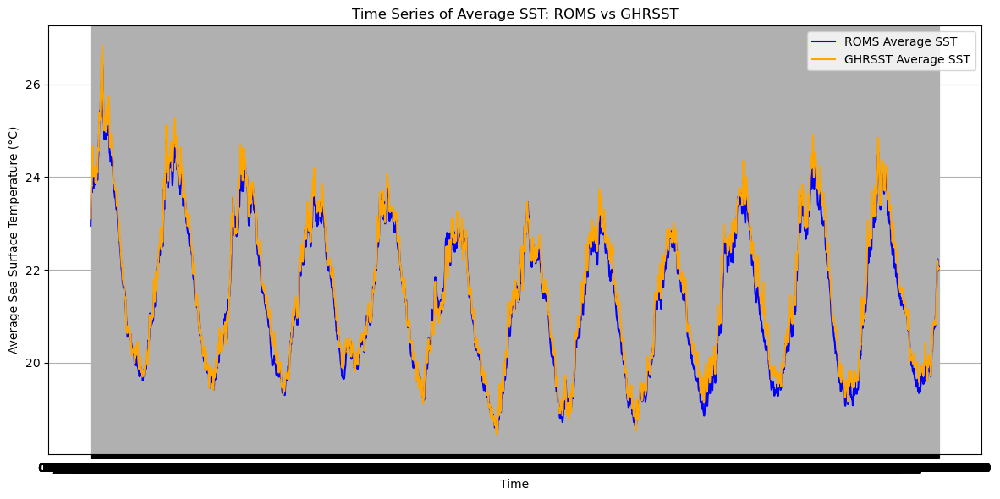

In [58]:
# Plotting the time series
plt.figure(figsize=(12, 6))
plt.plot(rom_avg_df['ocean_time'], rom_avg_df['ROMS Average SST'], label='ROMS Average SST', color='blue')
plt.plot(rom_avg_df['ocean_time'], ghr_avg_df['GHRSST Average SST'], label='GHRSST Average SST', color='orange')

# Add titles and labels
plt.title('Time Series of Average SST: ROMS vs GHRSST')
plt.xlabel('Time')
plt.ylabel('Average Sea Surface Temperature (°C)')
plt.legend()
plt.grid()
#plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
plt.tight_layout()

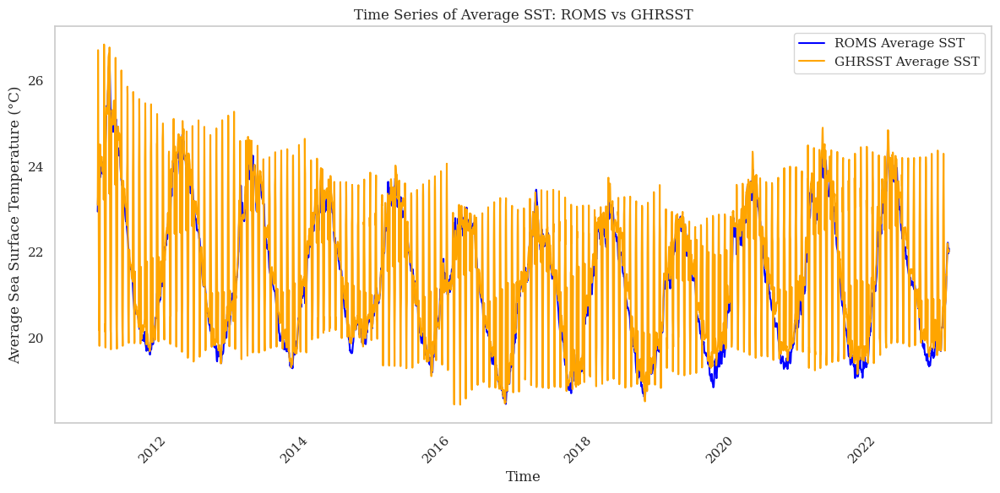

In [90]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import pandas as pd
rom_avg_df = pd.read_csv("/csiem/ROM_sst_2011_2022.csv")
ghr_avg_df = pd.read_csv("/home/ubuntu/WAMSI/ghrsst_2011_to_2022_WA_Scale.csv")
# Ensure 'ocean_time' and 'time' are in datetime format
rom_avg_df['ocean_time'] = pd.to_datetime(rom_avg_df['ocean_time'])
ghr_avg_df['time'] = pd.to_datetime(ghr_avg_df['time'])

# Set 'ocean_time' and 'time' as the index
rom_avg_df.set_index('ocean_time', inplace=True)
ghr_avg_df.set_index('time', inplace=True)

# Sort the DataFrames by the index
#rom_avg_df.sort_index(inplace=True)
ghr_avg_df.sort_index(inplace=True)

# Plotting the time series
plt.figure(figsize=(12, 6))
plt.plot(ghr_avg_df.index, rom_avg_df['ROMS Average SST'], label='ROMS Average SST', color='blue')
plt.plot(ghr_avg_df.index, ghr_avg_df['GHRSST Average SST'], label='GHRSST Average SST', color='orange')
plt.title('Time Series of Average SST: ROMS vs GHRSST')
plt.xlabel('Time')
plt.ylabel('Average Sea Surface Temperature (°C)')
plt.legend()
plt.grid()
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

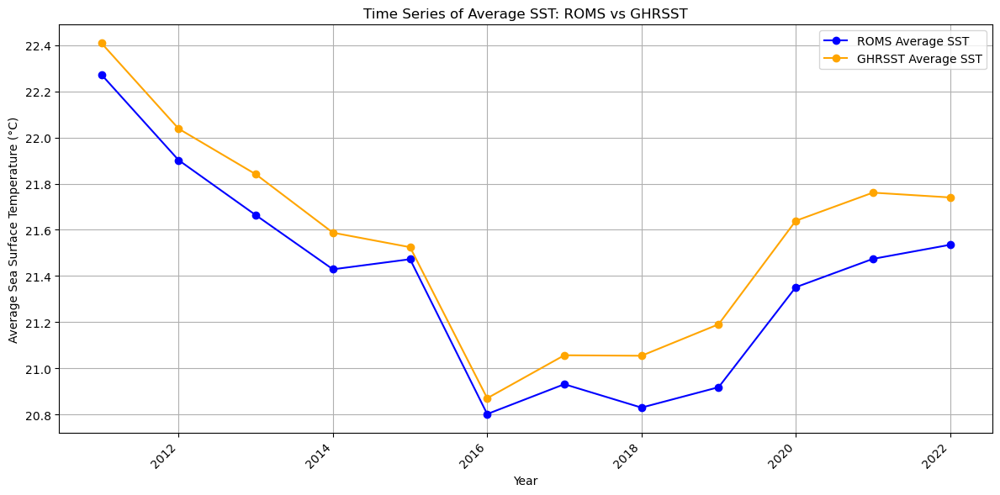

In [4]:
import matplotlib.pyplot as plt
import pandas as pd

# Load the data
rom_avg_df = pd.read_csv("/csiem/ROM_sst_2011_2022.csv")
ghr_avg_df = pd.read_csv("/home/ubuntu/WAMSI/ghrsst_2011_to_2022_WA_Scale.csv")

# Ensure 'ocean_time' and 'time' are in datetime format
rom_avg_df['ocean_time'] = pd.to_datetime(rom_avg_df['ocean_time'])
ghr_avg_df['time'] = pd.to_datetime(ghr_avg_df['time'])

# Extract the year from the date columns
rom_avg_df['year'] = rom_avg_df['ocean_time'].dt.year
ghr_avg_df['year'] = ghr_avg_df['time'].dt.year

# Group by year and calculate the mean for each year
rom_avg_yearly = rom_avg_df.groupby('year')['ROMS Average SST'].mean()
ghr_avg_yearly = ghr_avg_df.groupby('year')['GHRSST Average SST'].mean()

# Plotting the time series with markers and simplified x-axis labels
plt.figure(figsize=(12, 6))
plt.plot(rom_avg_yearly.index, rom_avg_yearly, label='ROMS Average SST', color='blue', marker='o')
plt.plot(ghr_avg_yearly.index, ghr_avg_yearly, label='GHRSST Average SST', color='orange', marker='o')
plt.title('Time Series of Average SST: ROMS vs GHRSST')
plt.xlabel('Year')
plt.ylabel('Average Sea Surface Temperature (°C)')
plt.legend()
plt.grid()
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

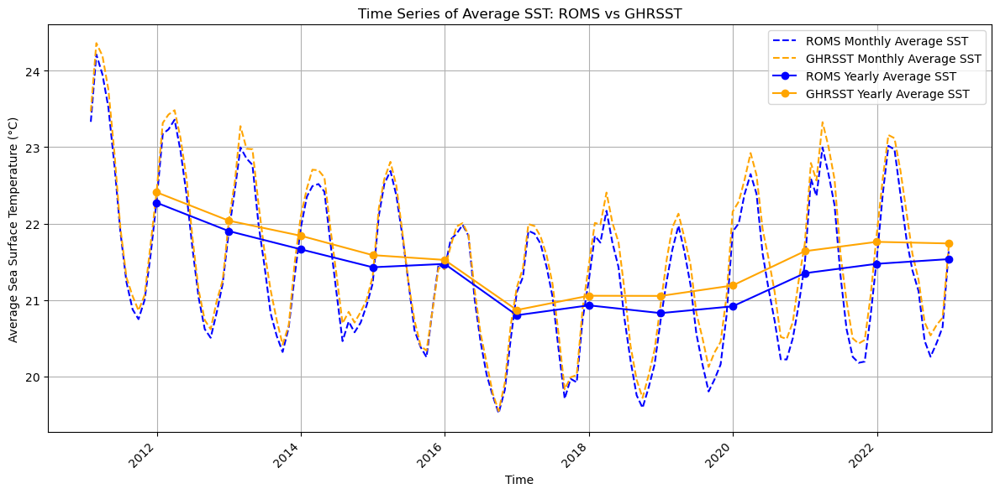

In [7]:
import matplotlib.pyplot as plt
import pandas as pd

# Load the data
rom_avg_df = pd.read_csv("/csiem/ROM_sst_2011_2022.csv")
ghr_avg_df = pd.read_csv("/home/ubuntu/WAMSI/ghrsst_2011_to_2022_WA_Scale.csv")

# Ensure 'ocean_time' and 'time' are in datetime format
rom_avg_df['ocean_time'] = pd.to_datetime(rom_avg_df['ocean_time'])
ghr_avg_df['time'] = pd.to_datetime(ghr_avg_df['time'])

# Set 'ocean_time' and 'time' as the index
rom_avg_df.set_index('ocean_time', inplace=True)
ghr_avg_df.set_index('time', inplace=True)

# # Calculate daily, monthly, and yearly averages
# rom_daily = rom_avg_df['ROMS Average SST'].sort_index()
# ghr_daily = ghr_avg_df['GHRSST Average SST'].sort_index()

rom_monthly = rom_avg_df['ROMS Average SST'].resample('M').mean()
ghr_monthly = ghr_avg_df['GHRSST Average SST'].resample('M').mean()

rom_yearly = rom_avg_df['ROMS Average SST'].resample('Y').mean()
ghr_yearly = ghr_avg_df['GHRSST Average SST'].resample('Y').mean()

# Plotting the time series with daily, monthly, and yearly averages
plt.figure(figsize=(12, 6))

# Daily averages
# plt.plot(rom_daily.index, rom_daily, label='ROMS Daily Average SST', color='blue', linestyle='-', alpha=0.3)
# plt.plot(ghr_daily.index, ghr_daily, label='GHRSST Daily Average SST', color='orange', linestyle='-', alpha=0.3)

# Monthly averages
plt.plot(rom_monthly.index, rom_monthly, label='ROMS Monthly Average SST', color='blue', linestyle='--')
plt.plot(ghr_monthly.index, ghr_monthly, label='GHRSST Monthly Average SST', color='orange', linestyle='--')

# Yearly averages
plt.plot(rom_yearly.index, rom_yearly, label='ROMS Yearly Average SST', color='blue', marker='o')
plt.plot(ghr_yearly.index, ghr_yearly, label='GHRSST Yearly Average SST', color='orange', marker='o')

plt.title('Time Series of Average SST: ROMS vs GHRSST')
plt.xlabel('Time')
plt.ylabel('Average Sea Surface Temperature (°C)')
plt.legend()
plt.grid()
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

In [9]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from scipy import stats

# Load the data
rom_avg_df = pd.read_csv("/csiem/ROM_sst_2011_2022.csv")
ghr_avg_df = pd.read_csv("/home/ubuntu/WAMSI/ghrsst_2011_to_2022_WA_Scale.csv")

In [10]:
# Concatenate the DataFrames vertically
concatenated_df = pd.concat([rom_avg_df, ghr_avg_df], axis=1)

# Display the concatenated DataFrame
print(concatenated_df)

      Unnamed: 0        ocean_time  s_rho  ROMS Average SST  Unnamed: 0  \
0              0  01/01/2011 12:00  -0.02         22.952004         0.0   
1              1  02/01/2011 12:00  -0.02         23.118299         1.0   
2              2  03/01/2011 12:00  -0.02         23.339871         2.0   
3              3  04/01/2011 12:00  -0.02         23.709537         3.0   
4              4  05/01/2011 12:00  -0.02         23.859411         4.0   
...          ...               ...    ...               ...         ...   
4378        4379  27/12/2022 12:00  -0.02         21.975800      4376.0   
4379        4380  28/12/2022 12:00  -0.02         21.977347      4377.0   
4380        4381  29/12/2022 12:00  -0.02         22.084294      4378.0   
4381        4382  30/12/2022 12:00  -0.02         22.096943      4379.0   
4382        4383  31/12/2022 12:00  -0.02         22.017389      4380.0   

                  time  GHRSST Average SST  
0     01/01/2011 09:00           23.111940  
1     02/

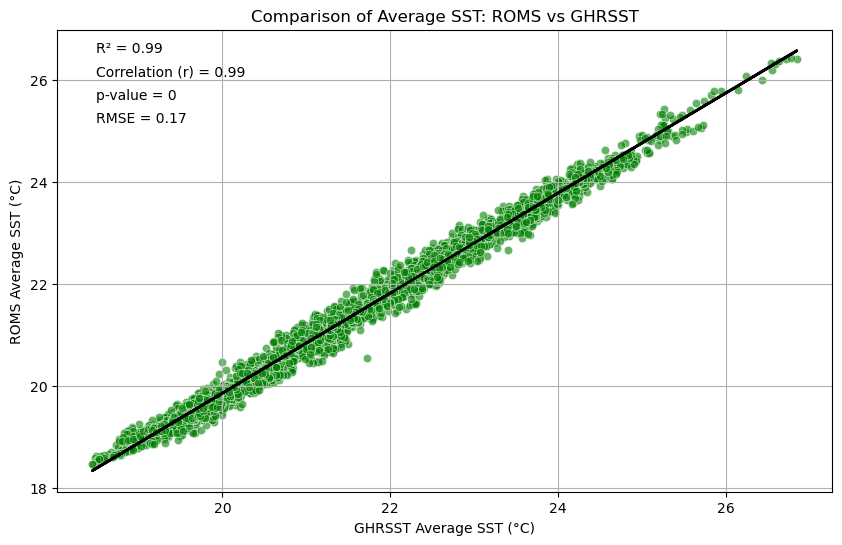

In [12]:
# Create scatter plot
plt.figure(figsize=(10, 6))
sns.scatterplot(data=concatenated_df, x='GHRSST Average SST', y='ROMS Average SST', color='green', alpha=0.6)

# Fit a linear regression model
x = concatenated_df['GHRSST Average SST'].values.reshape(-1, 1)
y = concatenated_df['ROMS Average SST'].values
model = LinearRegression().fit(x, y)
y_pred = model.predict(x)

# Calculate statistics
r, p_value = stats.pearsonr(concatenated_df['GHRSST Average SST'], concatenated_df['ROMS Average SST'])
rmse = np.sqrt(mean_squared_error(y, y_pred))
r_squared = model.score(x, y)

# Plot regression line
plt.plot(concatenated_df['GHRSST Average SST'], y_pred, color='black', linewidth=2)

# Add labels and title
plt.xlabel('GHRSST Average SST (°C)')
plt.ylabel('ROMS Average SST (°C)')
plt.title('Comparison of Average SST: ROMS vs GHRSST')

# Display statistics on the plot
plt.text(0.05, 0.95, f'R² = {r_squared:.2f}', transform=plt.gca().transAxes)
plt.text(0.05, 0.90, f'Correlation (r) = {r:.2f}', transform=plt.gca().transAxes)
plt.text(0.05, 0.85, f'p-value = {p_value:.2g}', transform=plt.gca().transAxes)
plt.text(0.05, 0.80, f'RMSE = {rmse:.2f}', transform=plt.gca().transAxes)

# Show plot
plt.grid()
plt.show()

In [39]:
import matplotlib.pyplot as plt
import pandas as pd
# Load the data
rom_avg_df = pd.read_csv("/csiem/ROM_salt_2011_2022.csv")
ghr_avg_df = pd.read_csv("/home/ubuntu/WAMSI/moi_salt_2011_to_2022_WA_Scale.csv")

In [32]:
rom_avg_df

,Unnamed: 0,ocean_time,s_rho,ROMS Average Salt
0,0,1/01/2011 12:00,-0.02,35.415913
1,1,2/01/2011 12:00,-0.02,35.401244
2,2,3/01/2011 12:00,-0.02,35.381275
3,3,4/01/2011 12:00,-0.02,35.371100
4,4,5/01/2011 12:00,-0.02,35.339200
...,...,...,...,...
4378,4379,27/12/2022 12:00,-0.02,35.526089
4379,4380,28/12/2022 12:00,-0.02,35.522348
4380,4381,29/12/2022 12:00,-0.02,35.521859
4381,4382,30/12/2022 12:00,-0.02,35.526575


In [33]:
ghr_avg_df.head()

,Unnamed: 0,time,depth,MOI Average Salt
0,0,2011-01-01,0.494025,35.305138
1,1,2011-01-02,0.494025,35.292507
2,2,2011-01-03,0.494025,35.277245
3,3,2011-01-04,0.494025,35.257584
4,4,2011-01-05,0.494025,35.224083


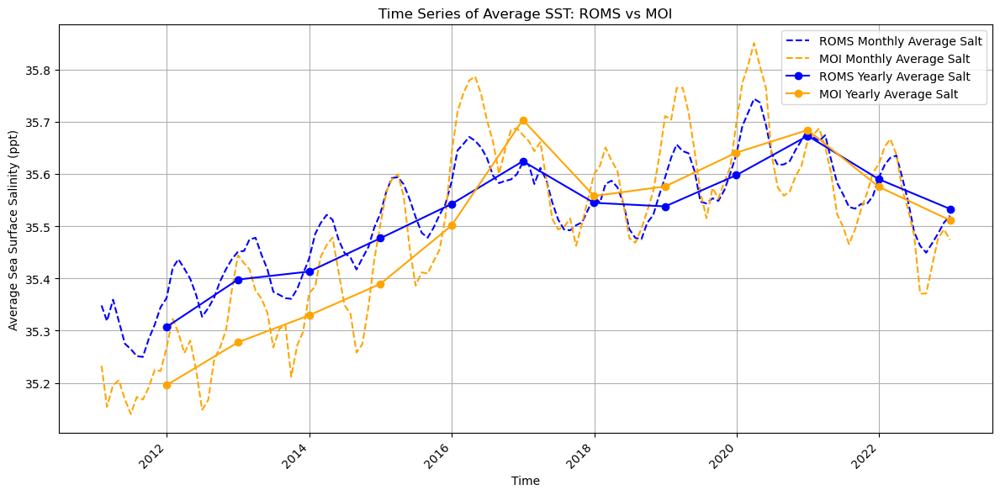

In [40]:
# Ensure 'ocean_time' and 'time' are in datetime format
rom_avg_df['ocean_time'] = pd.to_datetime(rom_avg_df['ocean_time'])
ghr_avg_df['time'] = pd.to_datetime(ghr_avg_df['time'])

# Set 'ocean_time' and 'time' as the index
rom_avg_df.set_index('ocean_time', inplace=True)
ghr_avg_df.set_index('time', inplace=True)

# # Calculate daily, monthly, and yearly averages
# rom_daily = rom_avg_df['ROMS Average SST'].sort_index()
# ghr_daily = ghr_avg_df['GHRSST Average SST'].sort_index()

rom_monthly = rom_avg_df['ROMS Average Salt'].resample('M').mean()
ghr_monthly = ghr_avg_df['MOI Average Salt'].resample('M').mean()

rom_yearly = rom_avg_df['ROMS Average Salt'].resample('Y').mean()
ghr_yearly = ghr_avg_df['MOI Average Salt'].resample('Y').mean()

# Plotting the time series with daily, monthly, and yearly averages
plt.figure(figsize=(12, 6))

# Daily averages
# plt.plot(rom_daily.index, rom_daily, label='ROMS Daily Average SST', color='blue', linestyle='-', alpha=0.3)
# plt.plot(ghr_daily.index, ghr_daily, label='GHRSST Daily Average SST', color='orange', linestyle='-', alpha=0.3)

# Monthly averages
plt.plot(rom_monthly.index, rom_monthly, label='ROMS Monthly Average Salt', color='blue', linestyle='--')
plt.plot(ghr_monthly.index, ghr_monthly, label='MOI Monthly Average Salt', color='orange', linestyle='--')

# Yearly averages
plt.plot(rom_yearly.index, rom_yearly, label='ROMS Yearly Average Salt', color='blue', marker='o')
plt.plot(ghr_yearly.index, ghr_yearly, label='MOI Yearly Average Salt', color='orange', marker='o')

plt.title('Time Series of Average SST: ROMS vs MOI')
plt.xlabel('Time')
plt.ylabel('Average Sea Surface Salinity (ppt)')
plt.legend()
plt.grid()
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

In [34]:
rom_avg_df = pd.read_csv("/csiem/ROM_salt_2011_2022.csv")
ghr_avg_df = pd.read_csv("/home/ubuntu/WAMSI/moi_salt_2011_to_2022_WA_Scale.csv")

In [35]:
# Concatenate the DataFrames vertically
concatenated_df = pd.concat([rom_avg_df, ghr_avg_df], axis=1)

# Display the concatenated DataFrame
print(concatenated_df)

      Unnamed: 0        ocean_time  s_rho  ROMS Average Salt  Unnamed: 0  \
0              0   1/01/2011 12:00  -0.02          35.415913           0   
1              1   2/01/2011 12:00  -0.02          35.401244           1   
2              2   3/01/2011 12:00  -0.02          35.381275           2   
3              3   4/01/2011 12:00  -0.02          35.371100           3   
4              4   5/01/2011 12:00  -0.02          35.339200           4   
...          ...               ...    ...                ...         ...   
4378        4379  27/12/2022 12:00  -0.02          35.526089        4378   
4379        4380  28/12/2022 12:00  -0.02          35.522348        4379   
4380        4381  29/12/2022 12:00  -0.02          35.521859        4380   
4381        4382  30/12/2022 12:00  -0.02          35.526575        4381   
4382        4383  31/12/2022 12:00  -0.02          35.532090        4382   

            time     depth  MOI Average Salt  
0     2011-01-01  0.494025         35.30

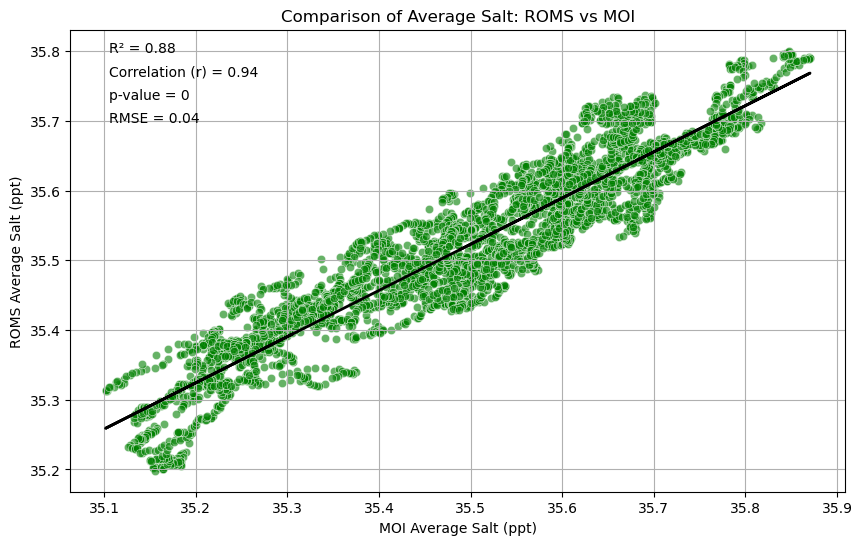

In [38]:
# Create scatter plot
plt.figure(figsize=(10, 6))
sns.scatterplot(data=concatenated_df, x='MOI Average Salt', y='ROMS Average Salt', color='green', alpha=0.6)

# Fit a linear regression model
x = concatenated_df['MOI Average Salt'].values.reshape(-1, 1)
y = concatenated_df['ROMS Average Salt'].values
model = LinearRegression().fit(x, y)
y_pred = model.predict(x)

# Calculate statistics
r, p_value = stats.pearsonr(concatenated_df['MOI Average Salt'], concatenated_df['ROMS Average Salt'])
rmse = np.sqrt(mean_squared_error(y, y_pred))
r_squared = model.score(x, y)

# Plot regression line
plt.plot(concatenated_df['MOI Average Salt'], y_pred, color='black', linewidth=2)

# Add labels and title
plt.xlabel('MOI Average Salt (ppt)')
plt.ylabel('ROMS Average Salt (ppt)')
plt.title('Comparison of Average Salt: ROMS vs MOI')

# Display statistics on the plot
plt.text(0.05, 0.95, f'R² = {r_squared:.2f}', transform=plt.gca().transAxes)
plt.text(0.05, 0.90, f'Correlation (r) = {r:.2f}', transform=plt.gca().transAxes)
plt.text(0.05, 0.85, f'p-value = {p_value:.2g}', transform=plt.gca().transAxes)
plt.text(0.05, 0.80, f'RMSE = {rmse:.2f}', transform=plt.gca().transAxes)

# Show plot
plt.grid()
plt.show()

#### LOCAL VALIDATION

In [4]:
import xarray as xr
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from cartopy.mpl.ticker import LongitudeFormatter, LatitudeFormatter  # Correct import
rom_sst=xr.open_dataset("/csiem/ROMS/Surface_temp/surface temp_Salt_2022.nc")
ghr_sst=xr.open_dataset("/csiem/sst_selected_2022.nc")

In [8]:
rom_sst=rom_sst.sel(lat=slice(-33, -31.5), lon=slice(115.16, 115.87))
ghr_sst=ghr_sst.sel(latitude=slice(-33, -31.5), longitude=slice(115.16, 115.87))

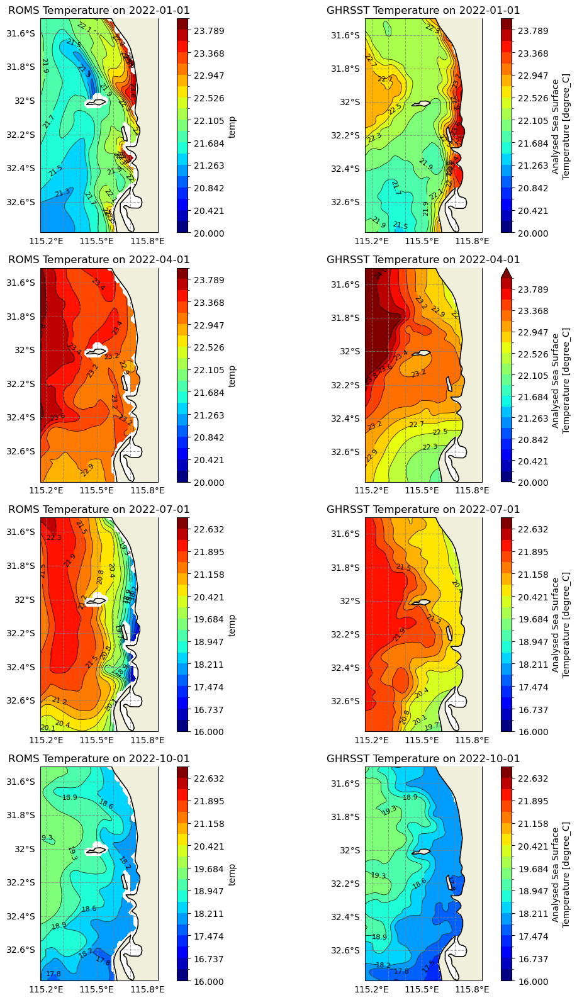

In [17]:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from cartopy.mpl.ticker import LongitudeFormatter, LatitudeFormatter
import pandas as pd
import xarray as xr
import numpy as np

# The four specific dates you want to plot
dates_to_plot = ['2022-01-01', '2022-04-01', '2022-07-01', '2022-10-01']
dates_to_plot = pd.to_datetime(dates_to_plot)

# Create a 4x2 grid (2 columns, 4 rows) for 8 plots (left ROMS, right GHRSST)
fig, axes = plt.subplots(nrows=4, ncols=2, figsize=(12, 16), 
                         subplot_kw={'projection': ccrs.PlateCarree()})

# Flatten axes for easier iteration
axes = axes.flatten()

# Loop through the dates and plot ROMS (left) and GHRSST (right) for each date
for i, date in enumerate(dates_to_plot):
    # ROMS Plot (left column)
    ax_roms = axes[2 * i]
    temp_roms = rom_sst.temp.sel(ocean_time=date, method='nearest')

    # GHRSST Plot (right column)
    ax_ghrsst = axes[2 * i + 1]
    temp_ghrsst = ghr_sst.analysed_sst.sel(time=date, method='nearest')

    # Set the color levels for contour plots based on the date
    if date.strftime('%Y-%m-%d') in ['2022-01-01', '2022-04-01']:
        vmin, vmax = 20, 24  # For January and April
    else:
        vmin, vmax = 16, 23  # For July and October

    levels = np.linspace(vmin, vmax, 20)

    # Plot ROMS with filled contours and contour lines
    contourf_roms = temp_roms.plot.contourf(ax=ax_roms, transform=ccrs.PlateCarree(),
                                            cmap='jet', levels=levels, add_colorbar=True)
    contours_roms = temp_roms.plot.contour(ax=ax_roms, transform=ccrs.PlateCarree(),
                                           colors='black', linewidths=0.5, levels=levels)
    plt.clabel(contours_roms, inline=True, fontsize=8, fmt='%.1f', colors='black')
    ax_roms.coastlines()
    ax_roms.add_feature(cfeature.LAND, zorder=10, edgecolor='black')
    ax_roms.set_title(f'ROMS Temperature on {date.strftime("%Y-%m-%d")}', fontsize=12)

    # Add gridlines for ROMS
    gl_roms = ax_roms.gridlines(draw_labels=True, linewidth=0.8, color='gray', alpha=0.7, linestyle='--')
    gl_roms.top_labels = False
    gl_roms.right_labels = False
    gl_roms.xformatter = LongitudeFormatter()
    gl_roms.yformatter = LatitudeFormatter()

    # Plot GHRSST with filled contours and contour lines
    contourf_ghrsst = temp_ghrsst.plot.contourf(ax=ax_ghrsst, transform=ccrs.PlateCarree(),
                                                cmap='jet', levels=levels, add_colorbar=True) 
    contours_ghrsst = temp_ghrsst.plot.contour(ax=ax_ghrsst, transform=ccrs.PlateCarree(),
                                               colors='black', linewidths=0.5, levels=levels)
    plt.clabel(contours_ghrsst, inline=True, fontsize=8, fmt='%.1f', colors='black')
    ax_ghrsst.coastlines()
    ax_ghrsst.add_feature(cfeature.LAND, zorder=10, edgecolor='black')
    ax_ghrsst.set_title(f'GHRSST Temperature on {date.strftime("%Y-%m-%d")}', fontsize=12)

    # Add gridlines for GHRSST
    gl_ghrsst = ax_ghrsst.gridlines(draw_labels=True, linewidth=0.8, color='gray', alpha=0.7, linestyle='--')
    gl_ghrsst.top_labels = False
    gl_ghrsst.right_labels = False
    gl_ghrsst.xformatter = LongitudeFormatter()
    gl_ghrsst.yformatter = LatitudeFormatter()

# Adjust layout to prevent overlap
plt.tight_layout()

# Show the plot
plt.show()

In [20]:
rom_sst=xr.open_dataset("/csiem/ROMS/Surface_temp/surface temp_Salt_2011.nc")
ghr_sst=xr.open_dataset("/csiem/sst_selected_2011.nc")

In [21]:
rom_sst=rom_sst.sel(lat=slice(-33, -31.5), lon=slice(115.16, 115.87))
ghr_sst=ghr_sst.sel(latitude=slice(-33, -31.5), longitude=slice(115.16, 115.87))

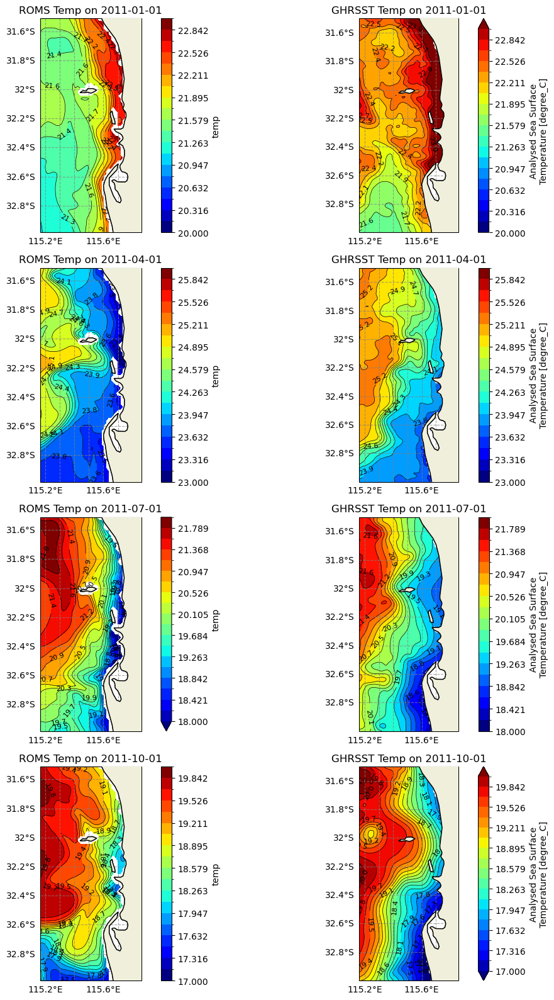

In [26]:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from cartopy.mpl.ticker import LongitudeFormatter, LatitudeFormatter
import pandas as pd
import xarray as xr
import numpy as np

# The four specific dates you want to plot
dates_to_plot = ['2011-01-01', '2011-04-01', '2011-07-01', '2011-10-01']
dates_to_plot = pd.to_datetime(dates_to_plot)

# Create a 4x2 grid (2 columns, 4 rows) for 8 plots (left ROMS, right GHRSST)
fig, axes = plt.subplots(nrows=4, ncols=2, figsize=(12, 16), 
                         subplot_kw={'projection': ccrs.PlateCarree()})

# Flatten axes for easier iteration
axes = axes.flatten()
 Loop through the dates and plot all datasets for each date
for i, date in enumerate(dates_to_plot):
    # Set colorbar limits based on the specific date
    if date.strftime('%Y-%m-%d') == '2023-01-01':
        vmin, vmax = 20, 23  # For January 1, 2023
    elif date.strftime('%Y-%m-%d') == '2023-04-01':
        vmin, vmax = 23, 26  # For April 1, 2023
    elif date.strftime('%Y-%m-%d') == '2023-07-01':
        vmin, vmax = 18, 22  # For July 1, 2023
    elif date.strftime('%Y-%m-%d') == '2023-10-01':
        vmin, vmax = 17, 20  # For October 1, 2023
    else:
        vmin, vmax = 15, 30  # Default case
    
    levels = np.linspace(vmin, vmax, 20)
# Loop through the dates and plot ROMS (left) and GHRSST (right) for each date
for i, date in enumerate(dates_to_plot):
    # ROMS Plot (left column)
    ax_roms = axes[2 * i]
    temp_roms = rom_sst.temp.sel(ocean_time=date, method='nearest')

    # GHRSST Plot (right column)
    ax_ghrsst = axes[2 * i + 1]
    temp_ghrsst = ghr_sst.analysed_sst.sel(time=date, method='nearest')

    # Set the color levels for contour plots based on the date
    if date.strftime('%Y-%m-%d') == '2011-01-01':
        vmin, vmax = 20, 23  # For January 1, 2021
    elif date.strftime('%Y-%m-%d') == '2011-04-01':
        vmin, vmax = 23, 26  # For April 1, 2011
    elif date.strftime('%Y-%m-%d') == '2011-07-01':
        vmin, vmax = 18, 22  # For July 1, 2021
    elif date.strftime('%Y-%m-%d') == '2011-10-01':
        vmin, vmax = 17, 20  # For October 1, 2021
    else:
        vmin, vmax = 17, 20  # Default case
    
    levels = np.linspace(vmin, vmax, 20)

    # Plot ROMS with filled contours and contour lines
    contourf_roms = temp_roms.plot.contourf(ax=ax_roms, transform=ccrs.PlateCarree(),
                                            cmap='jet', levels=levels, add_colorbar=True)
    contours_roms = temp_roms.plot.contour(ax=ax_roms, transform=ccrs.PlateCarree(),
                                           colors='black', linewidths=0.5, levels=levels)
    plt.clabel(contours_roms, inline=True, fontsize=8, fmt='%.1f', colors='black')
    ax_roms.coastlines()
    ax_roms.add_feature(cfeature.LAND, zorder=10, edgecolor='black')
    ax_roms.set_title(f'ROMS Temp on {date.strftime("%Y-%m-%d")}', fontsize=12)

    # Add gridlines for ROMS
    gl_roms = ax_roms.gridlines(draw_labels=True, linewidth=0.8, color='gray', alpha=0.7, linestyle='--')
    gl_roms.top_labels = False
    gl_roms.right_labels = False
    gl_roms.xformatter = LongitudeFormatter()
    gl_roms.yformatter = LatitudeFormatter()

    # Plot GHRSST with filled contours and contour lines
    contourf_ghrsst = temp_ghrsst.plot.contourf(ax=ax_ghrsst, transform=ccrs.PlateCarree(),
                                                cmap='jet', levels=levels, add_colorbar=True)
    contours_ghrsst = temp_ghrsst.plot.contour(ax=ax_ghrsst, transform=ccrs.PlateCarree(),
                                               colors='black', linewidths=0.5, levels=levels)
    plt.clabel(contours_ghrsst, inline=True, fontsize=8, fmt='%.1f', colors='black')
    ax_ghrsst.coastlines()
    ax_ghrsst.add_feature(cfeature.LAND, zorder=10, edgecolor='black')
    ax_ghrsst.set_title(f'GHRSST Temp on {date.strftime("%Y-%m-%d")}', fontsize=12)

    # Add gridlines for GHRSST
    gl_ghrsst = ax_ghrsst.gridlines(draw_labels=True, linewidth=0.8, color='gray', alpha=0.7, linestyle='--')
    gl_ghrsst.top_labels = False
    gl_ghrsst.right_labels = False
    gl_ghrsst.xformatter = LongitudeFormatter()
    gl_ghrsst.yformatter = LatitudeFormatter()

# Adjust layout to prevent overlap
plt.tight_layout()

# Show the plot
plt.show()

### Salinity compare

In [1]:
import xarray as xr
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from cartopy.mpl.ticker import LongitudeFormatter, LatitudeFormatter  # Correct import

In [2]:
rom_salt=xr.open_dataset("/csiem/ROMS/Surface_temp/surface temp_Salt_2011.nc")
moi_salt=xr.open_dataset("/csiem/cmems_mod_glo_phy_my_0.083deg_P1D-m_so_108.58E-116.25E_34.25S-22.58S_0.49m_2011-01-01-2021-06-30.nc")

In [3]:
moi_salt = moi_salt.sel(depth=0.494, method='nearest')
moi_salt

<xarray.Dataset>
Dimensions:    (latitude: 141, longitude: 93, time: 3834)
Coordinates:
    depth      float32 0.494
  * latitude   (latitude) float32 -34.25 -34.17 -34.08 ... -22.75 -22.67 -22.58
  * longitude  (longitude) float32 108.6 108.7 108.8 108.8 ... 116.1 116.2 116.2
  * time       (time) datetime64[ns] 2011-01-01 2011-01-02 ... 2021-06-30
Data variables:
    so         (time, latitude, longitude) float32 ...
Attributes: (12/25)
    Conventions:               CF-1.4
    bulletin_date:             2021-07-07 00:00:00
    bulletin_type:             operational
    comment:                   CMEMS product
    domain_name:               GL12
    easting:                   longitude
    ...                        ...
    references:                http://www.mercator-ocean.fr
    source:                    MERCATOR GLORYS12V1
    title:                     daily mean fields from Global Ocean Physics An...
    z_max:                     5727.9169921875
    z_min:                     0.49402499198913574
    copernicusmarine_version:  1.2.0

In [4]:
rom_salt=rom_salt.sel(lat=slice(-33, -31.5), lon=slice(115.16, 115.87))
moi_salt=moi_salt.sel(latitude=slice(-33, -31.5), longitude=slice(115.16, 115.87))

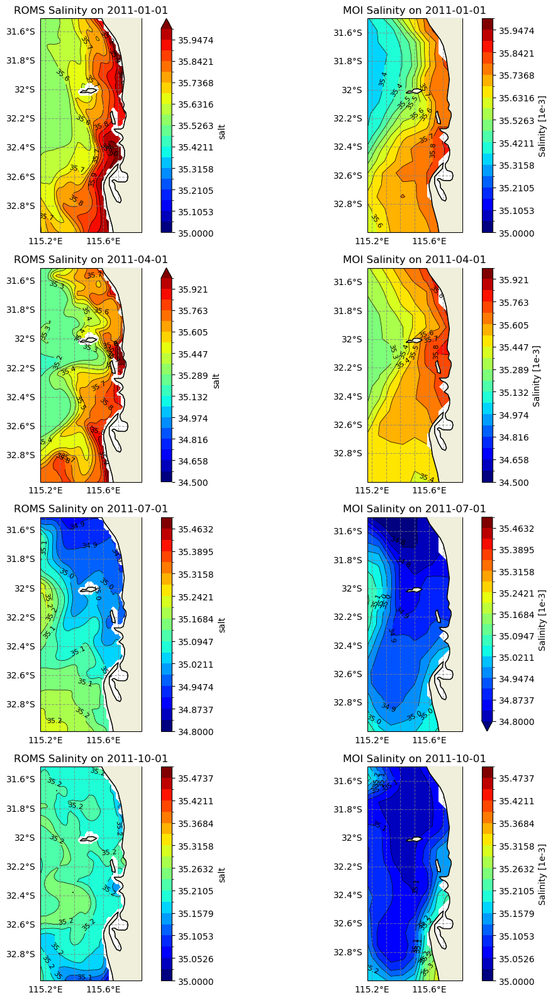

In [10]:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from cartopy.mpl.ticker import LongitudeFormatter, LatitudeFormatter
import pandas as pd
import xarray as xr
import numpy as np

# The four specific dates you want to plot
dates_to_plot = ['2011-01-01', '2011-04-01', '2011-07-01', '2011-10-01']
dates_to_plot = pd.to_datetime(dates_to_plot)

# Create a 4x2 grid (2 columns, 4 rows) for 8 plots (left ROMS, right GHRSST)
fig, axes = plt.subplots(nrows=4, ncols=2, figsize=(12, 16), 
                         subplot_kw={'projection': ccrs.PlateCarree()})

# Flatten axes for easier iteration
axes = axes.flatten()

# Loop through the dates and plot ROMS (left) and GHRSST (right) for each date
for i, date in enumerate(dates_to_plot):
    # ROMS Plot (left column)
    ax_roms = axes[2 * i]
    temp_roms = rom_salt.salt.sel(ocean_time=date, method='nearest')

    # GHRSST Plot (right column)
    ax_ghrsst = axes[2 * i + 1]
    temp_ghrsst = moi_salt.so.sel(time=date, method='nearest')

    # Set the color levels for contour plots based on the date
 
    if date.strftime('%Y-%m-%d') == '2011-01-01':
        vmin, vmax = 35, 36  # For January 1, 2021
    elif date.strftime('%Y-%m-%d') == '2011-04-01':
        vmin, vmax = 34.5, 36  # For April 1, 2011
    elif date.strftime('%Y-%m-%d') == '2011-07-01':
        vmin, vmax = 34.8, 35.5  # For July 1, 2021
    elif date.strftime('%Y-%m-%d') == '2011-10-01':
        vmin, vmax = 35, 35.5  # For October 1, 2021
    else:
        vmin, vmax = 34, 36  # Default case
    
    levels = np.linspace(vmin, vmax, 20)


    # Plot ROMS with filled contours and contour lines
    contourf_roms = temp_roms.plot.contourf(ax=ax_roms, transform=ccrs.PlateCarree(),
                                            cmap='jet', levels=levels, add_colorbar=True)
    contours_roms = temp_roms.plot.contour(ax=ax_roms, transform=ccrs.PlateCarree(),
                                           colors='black', linewidths=0.5, levels=levels)
    plt.clabel(contours_roms, inline=True, fontsize=8, fmt='%.1f', colors='black')
    ax_roms.coastlines()
    ax_roms.add_feature(cfeature.LAND, zorder=10, edgecolor='black')
    ax_roms.set_title(f'ROMS Salinity on {date.strftime("%Y-%m-%d")}', fontsize=12)

    # Add gridlines for ROMS
    gl_roms = ax_roms.gridlines(draw_labels=True, linewidth=0.8, color='gray', alpha=0.7, linestyle='--')
    gl_roms.top_labels = False
    gl_roms.right_labels = False
    gl_roms.xformatter = LongitudeFormatter()
    gl_roms.yformatter = LatitudeFormatter()

    # Plot GHRSST with filled contours and contour lines
    contourf_ghrsst = temp_ghrsst.plot.contourf(ax=ax_ghrsst, transform=ccrs.PlateCarree(),
                                                cmap='jet', levels=levels, add_colorbar=True)
    contours_ghrsst = temp_ghrsst.plot.contour(ax=ax_ghrsst, transform=ccrs.PlateCarree(),
                                               colors='black', linewidths=0.5, levels=levels)
    plt.clabel(contours_ghrsst, inline=True, fontsize=8, fmt='%.1f', colors='black')
    ax_ghrsst.coastlines()
    ax_ghrsst.add_feature(cfeature.LAND, zorder=10, edgecolor='black')
    ax_ghrsst.set_title(f'MOI Salinity on {date.strftime("%Y-%m-%d")}', fontsize=12)

    # Add gridlines for GHRSST
    gl_ghrsst = ax_ghrsst.gridlines(draw_labels=True, linewidth=0.8, color='gray', alpha=0.7, linestyle='--')
    gl_ghrsst.top_labels = False
    gl_ghrsst.right_labels = False
    gl_ghrsst.xformatter = LongitudeFormatter()
    gl_ghrsst.yformatter = LatitudeFormatter()

# Adjust layout to prevent overlap
plt.tight_layout()

# Show the plot
plt.show()

In [11]:
rom_salt=xr.open_dataset("/csiem/ROMS/Surface_temp/surface temp_Salt_2022.nc")
moi_salt=xr.open_dataset("/csiem/cmems_mod_glo_phy_myint_0.083deg_P1D-m_1728919139825.nc")

In [12]:
moi_salt = moi_salt.sel(depth=0.494, method='nearest')
moi_salt

<xarray.Dataset>
Dimensions:    (latitude: 141, longitude: 93, time: 549)
Coordinates:
    depth      float32 0.494
  * latitude   (latitude) float32 -34.25 -34.17 -34.08 ... -22.75 -22.67 -22.58
  * longitude  (longitude) float32 108.6 108.7 108.8 108.8 ... 116.1 116.2 116.3
  * time       (time) datetime64[ns] 2021-07-01 2021-07-02 ... 2022-12-31
Data variables:
    so         (time, latitude, longitude) float32 ...
Attributes:
    Conventions:       CF-1.11
    title:             cmems_mod_glo_phy_myint_0.083deg_P1D-m_202311
    subset:source:     ARCO data downloaded from the Marine Data Store using ...
    subset:productId:  GLOBAL_MULTIYEAR_PHY_001_030
    subset:datasetId:  cmems_mod_glo_phy_myint_0.083deg_P1D-m_202311
    subset:date:       2024-10-14T15:18:59.825Z

In [13]:
rom_salt=rom_salt.sel(lat=slice(-33, -31.5), lon=slice(115.16, 115.87))
moi_salt=moi_salt.sel(latitude=slice(-33, -31.5), longitude=slice(115.16, 115.87))

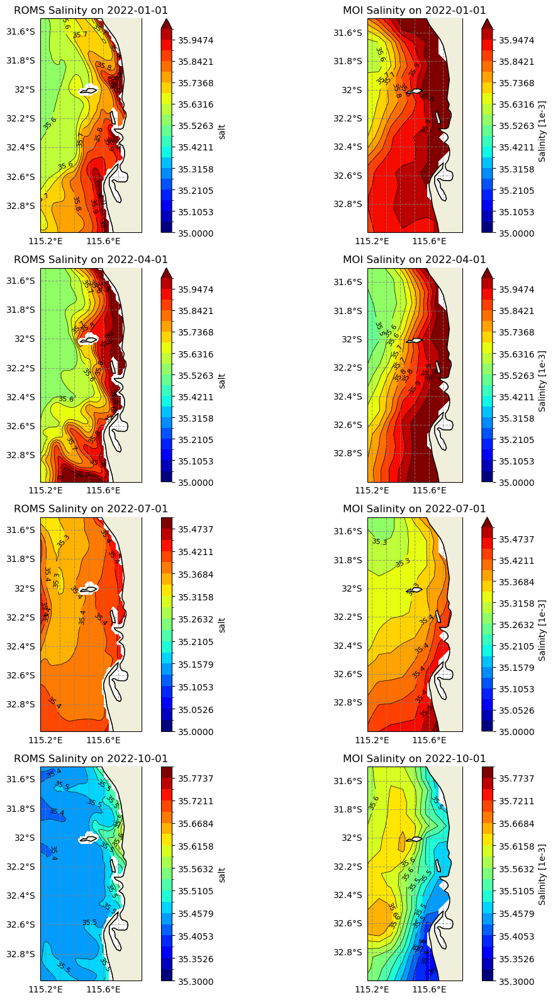

In [18]:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from cartopy.mpl.ticker import LongitudeFormatter, LatitudeFormatter
import pandas as pd
import xarray as xr
import numpy as np

# The four specific dates you want to plot
dates_to_plot = ['2022-01-01', '2022-04-01', '2022-07-01', '2022-10-01']
dates_to_plot = pd.to_datetime(dates_to_plot)

# Create a 4x2 grid (2 columns, 4 rows) for 8 plots (left ROMS, right GHRSST)
fig, axes = plt.subplots(nrows=4, ncols=2, figsize=(12, 16), 
                         subplot_kw={'projection': ccrs.PlateCarree()})

# Flatten axes for easier iteration
axes = axes.flatten()

# Loop through the dates and plot ROMS (left) and GHRSST (right) for each date
for i, date in enumerate(dates_to_plot):
    # ROMS Plot (left column)
    ax_roms = axes[2 * i]
    temp_roms = rom_salt.salt.sel(ocean_time=date, method='nearest')

    # GHRSST Plot (right column)
    ax_ghrsst = axes[2 * i + 1]
    temp_ghrsst = moi_salt.so.sel(time=date, method='nearest')

    # Set the color levels for contour plots based on the date
 
    if date.strftime('%Y-%m-%d') == '2022-01-01':
        vmin, vmax = 35, 36  # For January 1, 2021
    elif date.strftime('%Y-%m-%d') == '2022-04-01':
        vmin, vmax = 35, 36  # For April 1, 2011
    elif date.strftime('%Y-%m-%d') == '2022-07-01':
        vmin, vmax = 35, 35.5  # For July 1, 2021
    elif date.strftime('%Y-%m-%d') == '2022-10-01':
        vmin, vmax = 35.3, 35.8  # For October 1, 2021
    else:
        vmin, vmax = 34, 36  # Default case
    
    levels = np.linspace(vmin, vmax, 20)


    # Plot ROMS with filled contours and contour lines
    contourf_roms = temp_roms.plot.contourf(ax=ax_roms, transform=ccrs.PlateCarree(),
                                            cmap='jet', levels=levels, add_colorbar=True)
    contours_roms = temp_roms.plot.contour(ax=ax_roms, transform=ccrs.PlateCarree(),
                                           colors='black', linewidths=0.5, levels=levels)
    plt.clabel(contours_roms, inline=True, fontsize=8, fmt='%.1f', colors='black')
    ax_roms.coastlines()
    ax_roms.add_feature(cfeature.LAND, zorder=10, edgecolor='black')
    ax_roms.set_title(f'ROMS Salinity on {date.strftime("%Y-%m-%d")}', fontsize=12)

    # Add gridlines for ROMS
    gl_roms = ax_roms.gridlines(draw_labels=True, linewidth=0.8, color='gray', alpha=0.7, linestyle='--')
    gl_roms.top_labels = False
    gl_roms.right_labels = False
    gl_roms.xformatter = LongitudeFormatter()
    gl_roms.yformatter = LatitudeFormatter()

    # Plot GHRSST with filled contours and contour lines
    contourf_ghrsst = temp_ghrsst.plot.contourf(ax=ax_ghrsst, transform=ccrs.PlateCarree(),
                                                cmap='jet', levels=levels, add_colorbar=True)
    contours_ghrsst = temp_ghrsst.plot.contour(ax=ax_ghrsst, transform=ccrs.PlateCarree(),
                                               colors='black', linewidths=0.5, levels=levels)
    plt.clabel(contours_ghrsst, inline=True, fontsize=8, fmt='%.1f', colors='black')
    ax_ghrsst.coastlines()
    ax_ghrsst.add_feature(cfeature.LAND, zorder=10, edgecolor='black')
    ax_ghrsst.set_title(f'MOI Salinity on {date.strftime("%Y-%m-%d")}', fontsize=12)

    # Add gridlines for GHRSST
    gl_ghrsst = ax_ghrsst.gridlines(draw_labels=True, linewidth=0.8, color='gray', alpha=0.7, linestyle='--')
    gl_ghrsst.top_labels = False
    gl_ghrsst.right_labels = False
    gl_ghrsst.xformatter = LongitudeFormatter()
    gl_ghrsst.yformatter = LatitudeFormatter()

# Adjust layout to prevent overlap
plt.tight_layout()

# Show the plot
plt.show()

In [20]:
import xarray as xr
out_dir = "/csiem/sentinel"
several_ds = xr.open_mfdataset(f"{out_dir}/S3_Chl_2022"+"*.nc")
several_ds

<xarray.Dataset>
Dimensions:    (time: 365, latitude: 360, longitude: 360)
Coordinates:
  * latitude   (latitude) float32 -33.0 -32.99 -32.99 ... -31.01 -31.01 -31.0
  * longitude  (longitude) float32 114.0 114.0 114.0 114.0 ... 116.0 116.0 116.0
  * time       (time) datetime64[ns] 2022-01-01 2022-01-02 ... 2022-12-31
Data variables:
    CHL        (time, latitude, longitude) float32 dask.array<chunksize=(1, 360, 360), meta=np.ndarray>
Attributes: (12/92)
    Conventions:                     CF-1.8, ACDD-1.3
    DPM_reference:                   GC-UD-ACRI-PUG
    IODD_reference:                  GC-UD-ACRI-PUG
    acknowledgement:                 The Licensees will ensure that original ...
    citation:                        The Licensees will ensure that original ...
    cmems_product_id:                OCEANCOLOUR_GLO_BGC_L3_MY_009_103
    ...                              ...
    time_coverage_resolution:        P1D
    time_coverage_start:             2024-04-28T21:04:20Z
    title:                           cmems_obs-oc_glo_bgc-plankton_my_l3-olci...
    westernmost_longitude:           -180.0
    westernmost_valid_longitude:     -180.0
    copernicusmarine_version:        1.2.0

In [21]:
sev_m=several_ds.resample(time="1M").mean()
sev_m

<xarray.Dataset>
Dimensions:    (time: 12, latitude: 360, longitude: 360)
Coordinates:
  * latitude   (latitude) float32 -33.0 -32.99 -32.99 ... -31.01 -31.01 -31.0
  * longitude  (longitude) float32 114.0 114.0 114.0 114.0 ... 116.0 116.0 116.0
  * time       (time) datetime64[ns] 2022-01-31 2022-02-28 ... 2022-12-31
Data variables:
    CHL        (time, latitude, longitude) float32 dask.array<chunksize=(1, 360, 360), meta=np.ndarray>
Attributes: (12/92)
    Conventions:                     CF-1.8, ACDD-1.3
    DPM_reference:                   GC-UD-ACRI-PUG
    IODD_reference:                  GC-UD-ACRI-PUG
    acknowledgement:                 The Licensees will ensure that original ...
    citation:                        The Licensees will ensure that original ...
    cmems_product_id:                OCEANCOLOUR_GLO_BGC_L3_MY_009_103
    ...                              ...
    time_coverage_resolution:        P1D
    time_coverage_start:             2024-04-28T21:04:20Z
    title:                           cmems_obs-oc_glo_bgc-plankton_my_l3-olci...
    westernmost_longitude:           -180.0
    westernmost_valid_longitude:     -180.0
    copernicusmarine_version:        1.2.0

In [24]:
sev_m=sev_m.sel(latitude=slice(-33, -31.5), longitude=slice(115.16, 115.87))

In [26]:
import matplotlib.pyplot as plt
import matplotlib.colors as colors
import numpy as np
import pandas as pd
# Define the color map
color_values = [
    [147,0,108], [111,0,144], [72,0,183], [33,0,222], [0,10,255], [0,74,255],
    [0,144,255], [0,213,255], [0,255,215], [0,255,119], [0,255,15], [96,255,0],
    [200,255,0], [255,235,0], [255,183,0], [255,131,0], [255,79,0], [255,31,0],
    [230,0,0], [165,0,0], [105,0,0]
]
sample_values = [0.0105927390978, 0.01511153517746066, 0.02218493234759939,
                 0.03259381777070279, 0.047886418593687446, 0.06831451603621097,
                 0.10029112852033921, 0.1473464383750438, 0.2164794954661175,
                 0.30882852380362497, 0.4533847704508146, 0.6661070836975002,
                 0.786359751581525, 0.861169989723918, .9610500045872,
                 1.011261431529367, 1.124106633340013, 1.31407543621453,
                 1.45646919990738, 1.612969492356, 2.0]
cmap = colors.ListedColormap(np.array(color_values)/255.0)
norm = colors.BoundaryNorm(sample_values, len(sample_values))

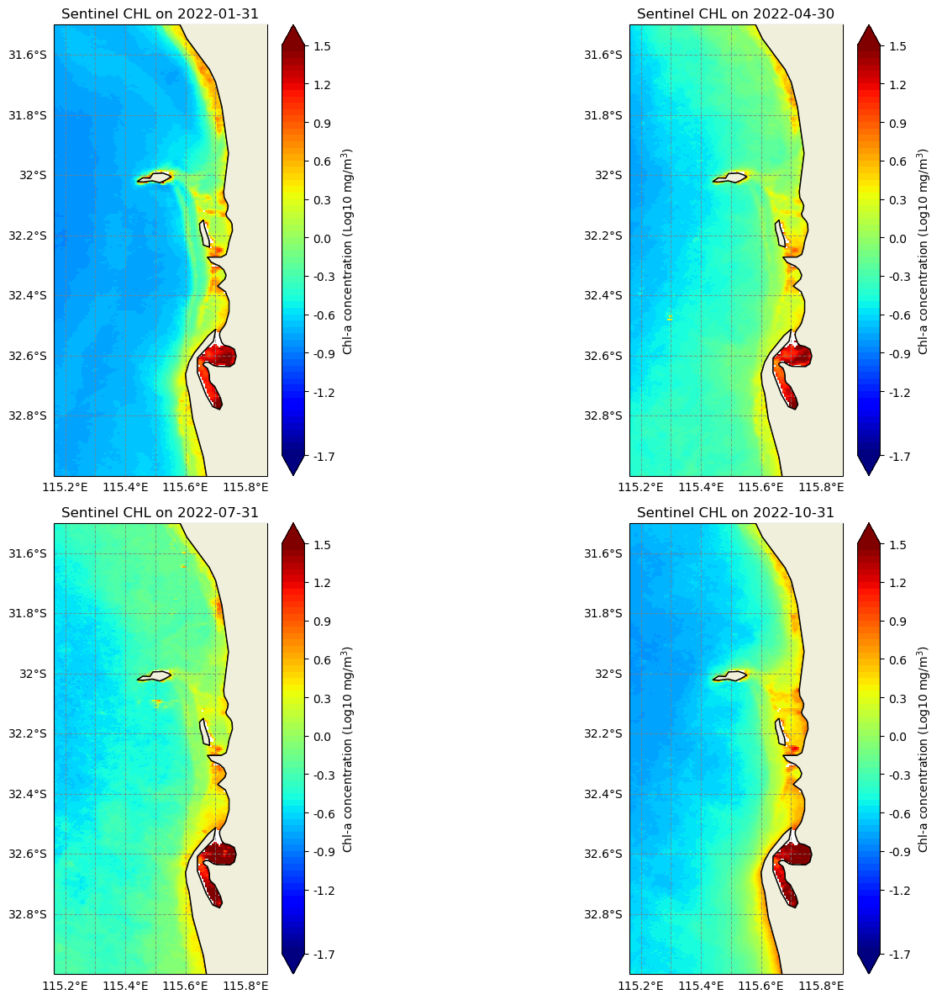

In [34]:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from cartopy.mpl.ticker import LongitudeFormatter, LatitudeFormatter
import pandas as pd
from matplotlib.colors import LogNorm
from matplotlib.ticker import FuncFormatter, NullLocator
import numpy as np

# Define dates to plot
dates_to_plot = ['2022-01-31', '2022-04-30', '2022-07-31', '2022-10-31']
dates_to_plot = pd.to_datetime(dates_to_plot)

# Log normalization range for chl-a concentration
vmin, vmax = 10**-1.7, 10**1.5
norm = LogNorm(vmin=vmin, vmax=vmax)

# Color map and figure settings
N = 64
cmap = plt.get_cmap('jet', N)
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(16, 12),
                         subplot_kw={'projection': ccrs.PlateCarree()})
axes = axes.flatten()

# Loop through dates and plot data for each subplot
for i, date in enumerate(dates_to_plot):
    ax = axes[i]

    # Select CHL data for the date
    chl_data = sev_m.CHL.sel(time=date, method='nearest')
    lon, lat = np.meshgrid(chl_data['longitude'], chl_data['latitude'])  # Adjust if needed

    # Plot with pcolormesh and LogNorm normalization
    mesh = ax.pcolormesh(lon, lat, chl_data, cmap=cmap, norm=norm, shading='auto', transform=ccrs.PlateCarree())
    
    # Add colorbar for each subplot
    cbar = plt.colorbar(mesh, ax=ax, orientation='vertical', pad=0.02, extend='both')
    cbar.set_label('Chl-a concentration (Log10 mg/m$^3$)', fontsize=10)
    ticks = [10**-1.7, 10**-1.2, 10**-0.9, 10**-0.6, 10**-0.3, 10**0, 10**0.3, 10**0.6, 10**0.9, 10**1.2, 10**1.5]
    cbar.set_ticks(ticks)
    cbar.ax.yaxis.set_major_formatter(FuncFormatter(lambda x, pos: f"{np.log10(x):.1f}" if x in ticks else ''))
    cbar.ax.yaxis.set_minor_locator(NullLocator())

    # Add coastlines and land
    ax.coastlines()
    ax.add_feature(cfeature.LAND, zorder=10, edgecolor='black')

    # Add gridlines with formatting
    gl = ax.gridlines(draw_labels=True, crs=ccrs.PlateCarree(),
                      linewidth=0.8, color='gray', alpha=0.7, linestyle='--')
    gl.top_labels = False
    gl.right_labels = False
    gl.xformatter = LongitudeFormatter()
    gl.yformatter = LatitudeFormatter()
    gl.xlabel_style = {'size': 10, 'color': 'black'}
    gl.ylabel_style = {'size': 10, 'color': 'black'}

    # Title for each subplot
    ax.set_title(f'Sentinel CHL on {date.strftime("%Y-%m-%d")}', fontsize=12)

# Adjust layout
plt.tight_layout()
plt.show()

### 2023 Comparasion between  GHRSST SST and ROMS SST 2km and 500m

In [2]:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from cartopy.mpl.ticker import LongitudeFormatter, LatitudeFormatter
import pandas as pd
import xarray as xr
import numpy as np
roms_500=xr.open_dataset("/csiem/ROMS/Surface_temp/Perth_surface temp_Salt_2023.nc")
roms_2km=xr.open_dataset("/csiem/Perth_surface__interp_2_KM_temp_Salt_2023.nc")
ghrsst_1km=xr.open_dataset("/csiem/sst_selected_2023.nc")

In [3]:
roms_500

<xarray.Dataset>
Dimensions:     (ocean_time: 365, lat: 259, lon: 129)
Coordinates:
  * ocean_time  (ocean_time) datetime64[ns] 2023-01-01T12:00:00 ... 2023-12-3...
    s_rho       float64 ...
  * lat         (lat) float64 -32.65 -32.64 -32.64 -32.63 ... -31.5 -31.5 -31.49
  * lon         (lon) float64 115.3 115.3 115.3 115.3 ... 115.9 115.9 115.9
Data variables:
    temp        (ocean_time, lat, lon) float64 ...
    salt        (ocean_time, lat, lon) float64 ...

In [4]:
roms_2km

<xarray.Dataset>
Dimensions:     (ocean_time: 365, lat: 640, lon: 480)
Coordinates:
  * ocean_time  (ocean_time) datetime64[ns] 2023-01-01T12:00:00 ... 2023-12-3...
    s_rho       float64 ...
  * lat         (lat) float64 -34.33 -34.31 -34.29 ... -22.61 -22.59 -22.57
  * lon         (lon) float64 108.5 108.5 108.5 108.6 ... 116.3 116.3 116.3
Data variables:
    temp        (ocean_time, lat, lon) float64 ...
    salt        (ocean_time, lat, lon) float64 ...

In [5]:
ghrsst_1km

<xarray.Dataset>
Dimensions:       (time: 365, latitude: 1175, longitude: 778)
Coordinates:
  * time          (time) datetime64[ns] 2023-01-01T09:00:00 ... 2023-12-31T09...
  * latitude      (latitude) float32 -34.32 -34.31 -34.3 ... -22.6 -22.59 -22.58
  * longitude     (longitude) float32 108.5 108.5 108.5 ... 116.3 116.3 116.3
Data variables:
    analysed_sst  (time, latitude, longitude) float64 ...

<Axes: >

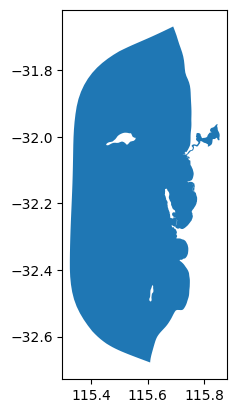

In [6]:
import geopandas as gpd
gdf=gpd.read_file("./Shapefile/csiem_material_011_1_MultiPolygon.shp")
gdf.plot()

In [7]:

import rioxarray
# Load the shapefile
gdf = gpd.read_file("./Shapefile/csiem_material_011_1_MultiPolygon.shp")

# Ensure the shapefile has a valid CRS
gdf = gdf.to_crs("EPSG:4326")  # Convert to WGS84 if necessary

In [8]:
import xarray as xr
import geopandas as gpd
import rioxarray

# Load datasets
roms_500 = xr.open_dataset("/csiem/ROMS/Surface_temp/Perth_surface temp_Salt_2023.nc")
roms_2km = xr.open_dataset("/csiem/Perth_surface__interp_2_KM_temp_Salt_2023.nc")
ghrsst_1km = xr.open_dataset("/csiem/sst_selected_2023.nc")

# Set spatial dimensions
roms_500 = roms_500.rio.set_spatial_dims(x_dim="lon", y_dim="lat", inplace=True)
roms_2km = roms_2km.rio.set_spatial_dims(x_dim="lon", y_dim="lat", inplace=True)
ghrsst_1km = ghrsst_1km.rio.set_spatial_dims(x_dim="longitude", y_dim="latitude", inplace=True)

# Assign CRS
roms_500.rio.write_crs("EPSG:4326", inplace=True)
roms_2km.rio.write_crs("EPSG:4326", inplace=True)
ghrsst_1km.rio.write_crs("EPSG:4326", inplace=True)

# Clip datasets
roms_500_cropped = roms_500.rio.clip(gdf.geometry, gdf.crs)
roms_2km_cropped = roms_2km.rio.clip(gdf.geometry, gdf.crs)
ghrsst_1km_cropped = ghrsst_1km.rio.clip(gdf.geometry, gdf.crs)

# Save the cropped datasets
# roms_500_cropped.to_netcdf("/csiem/cropped_roms_500.nc")
# roms_2km_cropped.to_netcdf("/csiem/cropped_roms_2km.nc")
# ghrsst_1km_cropped.to_netcdf("/csiem/cropped_ghrsst_1km.nc")

print("Cropped datasets have been successfully saved!")

Cropped datasets have been successfully saved!


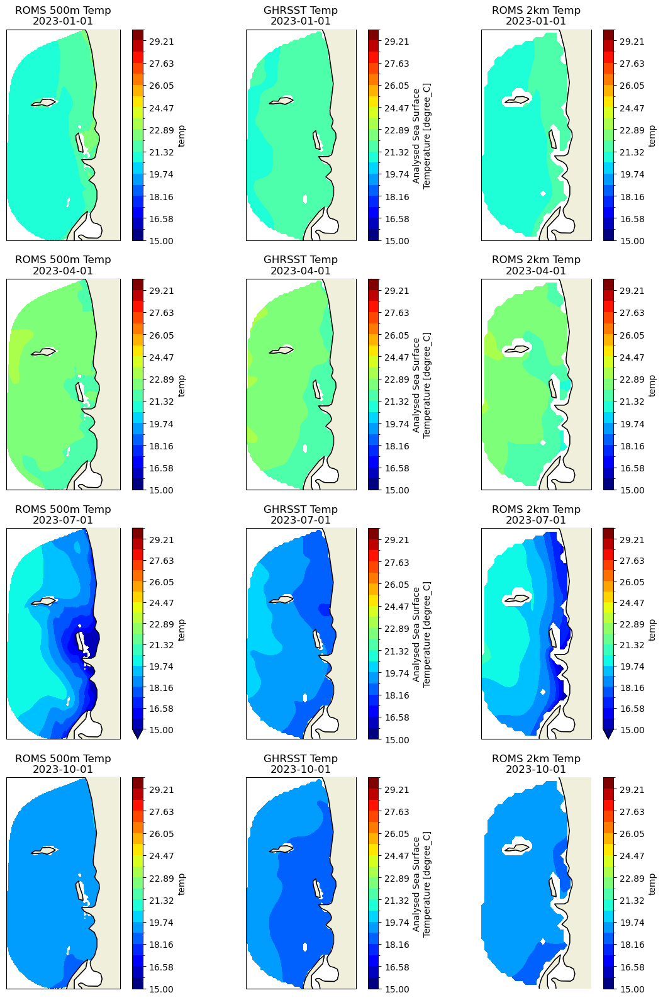

In [24]:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from cartopy.mpl.ticker import LongitudeFormatter, LatitudeFormatter
import pandas as pd
import numpy as np

# The four specific dates in 2023
dates_to_plot = ['2023-01-01', '2023-04-01', '2023-07-01', '2023-10-01']
dates_to_plot = pd.to_datetime(dates_to_plot)

# Create a 4x3 grid (3 columns, 4 rows) for 12 plots (ROMS 500m, GHRSST, ROMS 2km)
fig, axes = plt.subplots(nrows=4, ncols=3, figsize=(12, 16), 
                         subplot_kw={'projection': ccrs.PlateCarree()})

# Flatten axes for easier iteration
axes = axes.flatten()

# Loop through the dates and plot all datasets for each date
for i, date in enumerate(dates_to_plot):
    # ROMS 500m Plot (left column)
    ax_roms_500 = axes[3 * i]
    temp_roms_500 = roms_500_cropped.temp.sel(ocean_time=date, method='nearest')

    # GHRSST Plot (middle column)
    ax_ghrsst = axes[3 * i + 1]
    temp_ghrsst = ghrsst_1km_cropped.analysed_sst.sel(time=date, method='nearest')

    # ROMS 2km Plot (right column)
    ax_roms_2km = axes[3 * i + 2]
    temp_roms_2km = roms_2km_cropped.temp.sel(ocean_time=date, method='nearest')

    # Set the color levels for temperature
    vmin, vmax = 15, 30  # Adjust temperature range
    levels = np.linspace(vmin, vmax, 20)

    # Plot ROMS 500m
    temp_roms_500.plot.contourf(ax=ax_roms_500, transform=ccrs.PlateCarree(),
                                cmap='jet', levels=levels, add_colorbar=True)
    ax_roms_500.coastlines()
    ax_roms_500.add_feature(cfeature.LAND, zorder=10, edgecolor='black')
    ax_roms_500.set_title(f'ROMS 500m Temp\n{date.strftime("%Y-%m-%d")}', fontsize=12)

    # Plot GHRSST
    temp_ghrsst.plot.contourf(ax=ax_ghrsst, transform=ccrs.PlateCarree(),
                              cmap='jet', levels=levels, add_colorbar=True)
    ax_ghrsst.coastlines()
    ax_ghrsst.add_feature(cfeature.LAND, zorder=10, edgecolor='black')
    ax_ghrsst.set_title(f'GHRSST Temp\n{date.strftime("%Y-%m-%d")}', fontsize=12)

    # Plot ROMS 2km
    temp_roms_2km.plot.contourf(ax=ax_roms_2km, transform=ccrs.PlateCarree(),
                                cmap='jet', levels=levels, add_colorbar=True)
    ax_roms_2km.coastlines()
    ax_roms_2km.add_feature(cfeature.LAND, zorder=10, edgecolor='black')
    ax_roms_2km.set_title(f'ROMS 2km Temp\n{date.strftime("%Y-%m-%d")}', fontsize=12)


plt.axis('off')
plt.tight_layout()
# Show the plot
plt.show()

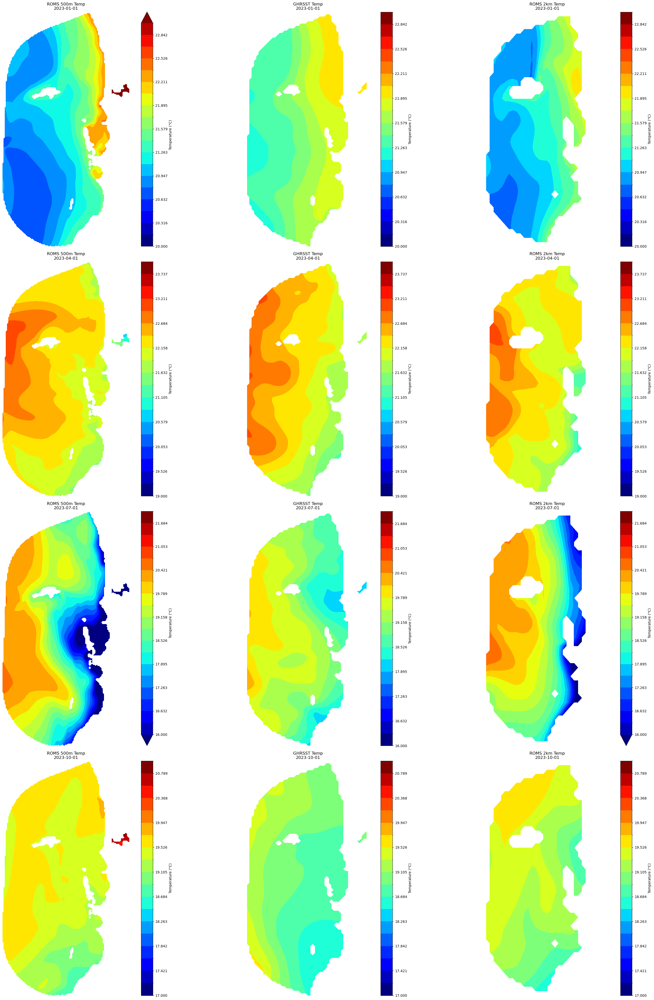

In [7]:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import pandas as pd
import numpy as np

# The four specific dates in 2023
dates_to_plot = ['2023-01-01', '2023-04-01', '2023-07-01', '2023-10-01']
dates_to_plot = pd.to_datetime(dates_to_plot)

# Define the bounds for the zoomed-in region (Cockburn Sound)

# Create a 4x3 grid (3 columns, 4 rows) for 12 plots (ROMS 500m, GHRSST, ROMS 2km)
fig, axes = plt.subplots(nrows=4, ncols=3, figsize=(32, 40), 
                         subplot_kw={'projection': ccrs.PlateCarree()})

# Flatten axes for easier iteration
axes = axes.flatten()

# Loop through the dates and plot all datasets for each date
for i, date in enumerate(dates_to_plot):
    # Set colorbar limits based on the specific date
    if date.strftime('%Y-%m-%d') == '2023-01-01':
        vmin, vmax = 20, 23  # For January 1, 2023
    elif date.strftime('%Y-%m-%d') == '2023-04-01':
        vmin, vmax = 19, 24  # For April 1, 2023
    elif date.strftime('%Y-%m-%d') == '2023-07-01':
        vmin, vmax = 16, 22  # For July 1, 2023
    elif date.strftime('%Y-%m-%d') == '2023-10-01':
        vmin, vmax = 17, 21  # For October 1, 2023
    else:
        vmin, vmax = 15, 30  # Default case
    
    levels = np.linspace(vmin, vmax, 20)

    # ROMS 500m Plot (left column)
    ax_roms_500 = axes[3 * i]
    temp_roms_500 = roms_500_cropped.temp.sel(ocean_time=date, method='nearest')
    ctf_500 = temp_roms_500.plot.contourf(ax=ax_roms_500, transform=ccrs.PlateCarree(),
                                          cmap='jet', levels=levels, add_colorbar=False)
    #ax_roms_500.add_feature(cfeature.LAND, zorder=10, edgecolor='black')
    ax_roms_500.set_title(f'ROMS 500m Temp\n{date.strftime("%Y-%m-%d")}', fontsize=12)
    cbar_500 = fig.colorbar(ctf_500, ax=ax_roms_500, orientation='vertical', fraction=0.046, pad=0.04)
    cbar_500.set_label('Temperature (°C)', fontsize=10)

    # GHRSST Plot (middle column)
    ax_ghrsst = axes[3 * i + 1]
    temp_ghrsst = ghrsst_1km_cropped.analysed_sst.sel(time=date, method='nearest')
    ctf_ghrsst = temp_ghrsst.plot.contourf(ax=ax_ghrsst, transform=ccrs.PlateCarree(),
                                           cmap='jet', levels=levels, add_colorbar=False)
    #ax_ghrsst.add_feature(cfeature.LAND, zorder=10, edgecolor='black')
    ax_ghrsst.set_title(f'GHRSST Temp\n{date.strftime("%Y-%m-%d")}', fontsize=12)
    cbar_ghrsst = fig.colorbar(ctf_ghrsst, ax=ax_ghrsst, orientation='vertical', fraction=0.046, pad=0.04)
    cbar_ghrsst.set_label('Temperature (°C)', fontsize=10)

    # ROMS 2km Plot (right column)
    ax_roms_2km = axes[3 * i + 2]
    temp_roms_2km = roms_2km_cropped.temp.sel(ocean_time=date, method='nearest')
    ctf_2km = temp_roms_2km.plot.contourf(ax=ax_roms_2km, transform=ccrs.PlateCarree(),
                                          cmap='jet', levels=levels, add_colorbar=False)
    #ax_roms_2km.add_feature(cfeature.LAND, zorder=10, edgecolor='black')
    ax_roms_2km.set_title(f'ROMS 2km Temp\n{date.strftime("%Y-%m-%d")}', fontsize=12)
    cbar_2km = fig.colorbar(ctf_2km, ax=ax_roms_2km, orientation='vertical', fraction=0.046, pad=0.04)
    cbar_2km.set_label('Temperature (°C)', fontsize=10)

    # Turn off axis labels (plt.axis('off'))
    ax_roms_500.axis('off')
    ax_ghrsst.axis('off')
    ax_roms_2km.axis('off')

# Adjust layout to prevent overlap
plt.tight_layout()

# Show the plot
plt.show()

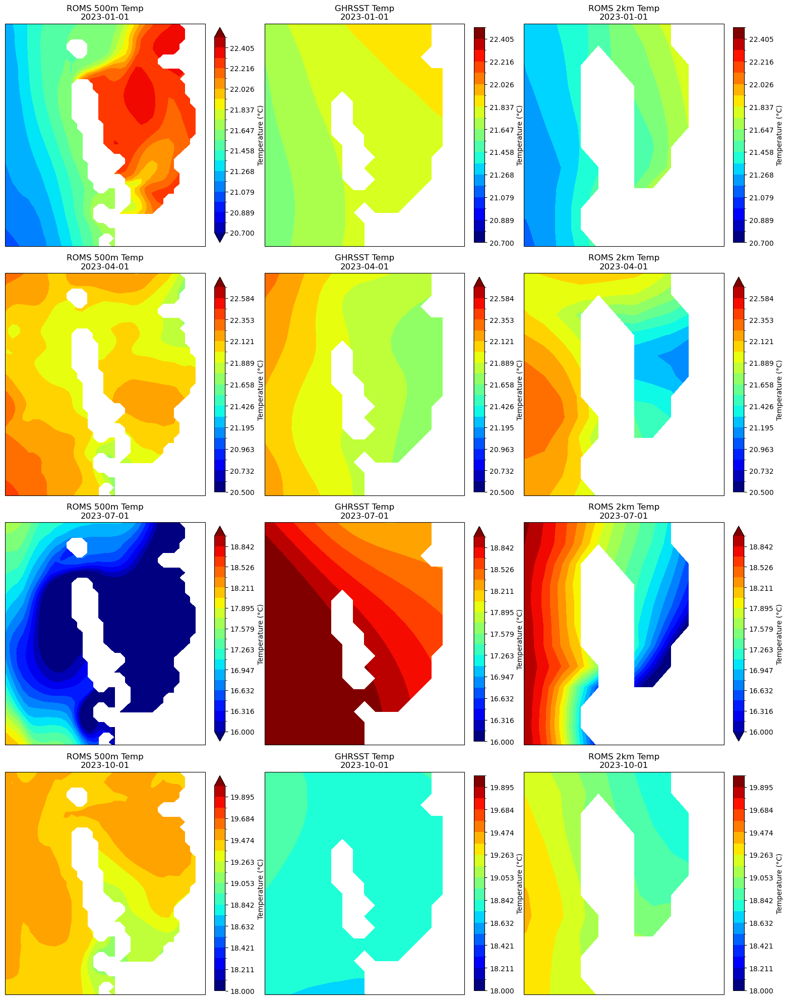

In [17]:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import numpy as np
import pandas as pd

# The four specific dates in 2023
dates_to_plot = ['2023-01-01', '2023-04-01', '2023-07-01', '2023-10-01']
dates_to_plot = pd.to_datetime(dates_to_plot)

# Define the geographical extent for Cockburn Sound
extent = [115.6, 115.78, -32.10, -32.3]  # [min_lon, max_lon, min_lat, max_lat]

# Create a 4x3 grid (4 rows for dates, 3 columns for ROMS 500m, GHRSST, ROMS 2km)
fig, axes = plt.subplots(nrows=4, ncols=3, figsize=(16,20), 
                         subplot_kw={'projection': ccrs.PlateCarree()})

# Flatten axes for easier iteration
axes = axes.flatten()

# Loop through the dates and datasets
for i, date in enumerate(dates_to_plot):
    # Set colorbar limits based on the specific date
    if date.strftime('%Y-%m-%d') == '2023-01-01':
        vmin, vmax = 20.7, 22.5
    elif date.strftime('%Y-%m-%d') == '2023-04-01':
        vmin, vmax = 20.5, 22.7
    elif date.strftime('%Y-%m-%d') == '2023-07-01':
        vmin, vmax = 16, 19
    elif date.strftime('%Y-%m-%d') == '2023-10-01':
        vmin, vmax = 18, 20
    else:
        vmin, vmax = 15, 30
    
    levels = np.linspace(vmin, vmax, 20)

    # ROMS 500m Plot (left column)
    ax_roms_500 = axes[3 * i]
    temp_roms_500 = roms_500_cropped.temp.sel(ocean_time=date, method='nearest')
    ctf_500 = temp_roms_500.plot.contourf(ax=ax_roms_500, transform=ccrs.PlateCarree(),
                                          cmap='jet', levels=levels, add_colorbar=False)
    ax_roms_500.set_extent(extent, crs=ccrs.PlateCarree())
    ax_roms_500.set_title(f'ROMS 500m Temp\n{date.strftime("%Y-%m-%d")}', fontsize=12)
    cbar_500 = fig.colorbar(ctf_500, ax=ax_roms_500, orientation='vertical', fraction=0.046, pad=0.04)
    cbar_500.set_label('Temperature (°C)', fontsize=10)

    # GHRSST Plot (middle column)
    ax_ghrsst = axes[3 * i + 1]
    temp_ghrsst = ghrsst_1km_cropped.analysed_sst.sel(time=date, method='nearest')
    ctf_ghrsst = temp_ghrsst.plot.contourf(ax=ax_ghrsst, transform=ccrs.PlateCarree(),
                                           cmap='jet', levels=levels, add_colorbar=False)
    ax_ghrsst.set_extent(extent, crs=ccrs.PlateCarree())
    ax_ghrsst.set_title(f'GHRSST Temp\n{date.strftime("%Y-%m-%d")}', fontsize=12)
    cbar_ghrsst = fig.colorbar(ctf_ghrsst, ax=ax_ghrsst, orientation='vertical', fraction=0.046, pad=0.04)
    cbar_ghrsst.set_label('Temperature (°C)', fontsize=10)

    # ROMS 2km Plot (right column)
    ax_roms_2km = axes[3 * i + 2]
    temp_roms_2km = roms_2km_cropped.temp.sel(ocean_time=date, method='nearest')
    ctf_2km = temp_roms_2km.plot.contourf(ax=ax_roms_2km, transform=ccrs.PlateCarree(),
                                          cmap='jet', levels=levels, add_colorbar=False)
    ax_roms_2km.set_extent(extent, crs=ccrs.PlateCarree())
    ax_roms_2km.set_title(f'ROMS 2km Temp\n{date.strftime("%Y-%m-%d")}', fontsize=12)
    cbar_2km = fig.colorbar(ctf_2km, ax=ax_roms_2km, orientation='vertical', fraction=0.046, pad=0.04)
    cbar_2km.set_label('Temperature (°C)', fontsize=10)

# Adjust layout and spacing
plt.tight_layout(h_pad=0.5, w_pad=0.4)
# Show the plot
plt.savefig("figure_compare.jpg", dpi=600)